# SegFormer Train

In [1]:
!nvidia-smi

Mon Sep 12 02:23:11 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    30W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
# from google.colab import drive
# drive.mount('/content/drive')

In [3]:
%%capture
!pip install wandb --upgrade

In [4]:
!cp /content/drive/MyDrive/Kaggle/netrc ~/.netrc

In [5]:
import wandb
wandb.login()

ERROR:wandb.jupyter:Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: aruaru0. Use `wandb login --relogin` to force relogin


True

## kaggle

In [6]:
!mkdir -p ~/.kaggle
!cp /content/drive/MyDrive/datas/kaggle.json  ~/.kaggle/

In [7]:
!chmod 600 /root/.kaggle/kaggle.json

In [8]:
!kaggle competitions download -c hubmap-organ-segmentation

100% 5.76G/5.78G [00:32<00:00, 240MB/s]
100% 5.78G/5.78G [00:32<00:00, 192MB/s]


In [9]:
# !mkdir hubmap
!unzip /content/hubmap-organ-segmentation.zip -d hubmap >/dev/null

In [10]:
!pip install pytorch-lightning
!pip install transformers datasets

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 706 kB 4.5 MB/s 
     |████████████████████████████████| 5.9 MB 58.2 MB/s 
     |████████████████████████████████| 419 kB 63.0 MB/s 
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.8.0
    Uninstalling tensorboard-2.8.0:
      Successfully uninstalled tensorboard-2.8.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.8.2+zzzcolab20220719082949 requires tensorboard<2.9,>=2.8, but you have tensorboard 2.10.0 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 4.7 MB 5.2 MB/s 
     |████████████████████████████████| 365 kB 69.8 MB/s 
     |████████████████████████████████| 

In [11]:
!pip install staintools
!pip install spams

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for staintools: filename=staintools-2.1.2-py3-none-any.whl size=14075 sha256=54420751ec2be2d6a26e92b644ed3e5c516e2df94f76248b1137d6a49fdfd4fb
  Stored in directory: /root/.cache/pip/wheels/9b/ed/74/9d36d40854e911d8e2d2d28d7b67e37e9f176f913ecf34f813
Successfully built staintools
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.0 MB 4.8 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for spams: filename=spams-2.6.5.4-cp37-cp37m-linux_x86_64.whl size=3236613 sha256=27d561c5248db1d09aa7ec67c1294bf482463e2a79f23d8be01716a1a7ad87a0
  Stored in directory: /root/.cache/pip/wheels/5e/92/17/e718e0e26bfcdd7e81afcf874ac2bc599dd7dd7f3ad78f9d76
Successfully built spams


In [12]:
# from google.colab import output
# output.enable_custom_widget_manager()

## Start code

In [13]:
import wandb
wandb.init(project="HuBMAP-SegFormer")

In [14]:
%load_ext tensorboard

In [15]:
from google.colab import output
output.enable_custom_widget_manager()

In [16]:
from torch.utils.tensorboard import SummaryWriter

In [17]:
from typing import Optional, List

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim.lr_scheduler import ConstantLR, LinearLR
from torch.utils.data import DataLoader
from torch.utils.data import Dataset as BaseDataset
import torchvision.transforms as transforms
import pytorch_lightning as pl
from pytorch_lightning.callbacks import LearningRateMonitor, ModelCheckpoint

# from timm import create_model

import numpy as np
import cv2
import matplotlib.pyplot as plt

import os
import albumentations as albu
import random

import pandas as pd

from tqdm.notebook import tqdm

from sklearn.model_selection import KFold

In [18]:
#https://www.kaggle.com/code/pestipeti/decoding-rle-masks/notebook
def mask2rle(img):
    '''
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated
    '''
    pixels= img.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)


def rle2mask(mask_rle, shape=(3000,3000)):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (width,height) of array to return 
    Returns numpy array, 1 - mask, 0 - background

    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0::2], s[1::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T

##  load test data

In [19]:
SEED = 2022 #43
BATCH_SIZE = 4
Gradient_Accumulation_Step = 7

In [20]:
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    #the following line gives ~10% speedup
    #but may lead to some stochasticity in the results 
    torch.backends.cudnn.benchmark = True
    
seed_everything(SEED)

### FOLD

In [21]:
DATA_DIR = './hubmap'
NFOLD = 5
FOLD = 4

WIDTH, HEIGHT = 512,512

model_path = '/content/drive/MyDrive/datas/HuBMAP/model-b5-fold{}.pth'.format(FOLD)
MODEL_NAME = "nvidia/mit-b5"
# MODEL_NAME = "nvidia/segformer-b3-finetuned-ade-512-512"

wandb.SEED = SEED
wandb.config.NFOLD = NFOLD
wandb.config.FOLD = FOLD
wandb.config.WIDTH = WIDTH
wandb.config.HEIGHT= HEIGHT
wandb.config.MODEL_NAME = MODEL_NAME

#
# nvidia/segformer-b0-finetuned-ade-512-512
# nvidia/segformer-b1-finetuned-ade-512-512
# nvidia/segformer-b2-finetuned-ade-512-512
# nvidia/segformer-b3-finetuned-ade-512-512
# nvidia/segformer-b4-finetuned-ade-512-512
# nvidia/segformer-b5-finetuned-ade-640-640
# https://huggingface.co/models?other=segformer&sort=downloads&search=nvidia%2Fsegformer+finetuned
#
df = pd.read_csv(DATA_DIR + '/train.csv')

In [22]:
# df = df[df['organ']=='lung'].reset_index()
df

,id,organ,data_source,img_height,img_width,pixel_size,tissue_thickness,rle,age,sex
0,10044,prostate,HPA,3000,3000,0.4,4,1459676 77 1462675 82 1465674 87 1468673 92 14...,37.0,Male
1,10274,prostate,HPA,3000,3000,0.4,4,715707 2 718705 8 721703 11 724701 18 727692 3...,76.0,Male
2,10392,spleen,HPA,3000,3000,0.4,4,1228631 20 1231629 24 1234624 40 1237623 47 12...,82.0,Male
3,10488,lung,HPA,3000,3000,0.4,4,3446519 15 3449517 17 3452514 20 3455510 24 34...,78.0,Male
4,10610,spleen,HPA,3000,3000,0.4,4,478925 68 481909 87 484893 105 487863 154 4908...,21.0,Female
...,...,...,...,...,...,...,...,...,...,...
346,9517,kidney,HPA,3000,3000,0.4,4,1611763 11 1614753 29 1617750 35 1620746 43 16...,61.0,Male
347,9769,kidney,HPA,3070,3070,0.4,4,4030400 28 4033466 34 4036526 48 4039594 54 40...,28.0,Male
348,9777,largeintestine,HPA,3000,3000,0.4,4,538473 13 541468 22 544463 30 547461 35 550459...,84.0,Male
349,9791,kidney,HPA,3000,3000,0.4,4,334733 33 337729 43 340729 43 343725 51 346723...,28.0,Male


In [23]:
# class2idx = dict([(name,i+1) for i, name in enumerate(df.organ.unique())])
# class2idx['none'] = 0
# idx2class = dict([(class2idx[name], name) for name in class2idx])

class2idx = {'prostate': 1,
  'spleen': 2,
  'lung': 3,
  'kidney': 4,
  'largeintestine': 5,
  'none': 0}
idx2class = {1: 'prostate',
  2: 'spleen',
  3: 'lung',
  4: 'kidney',
  5: 'largeintestine',
  0: 'none'}

class2idx, idx2class

({'prostate': 1,
  'spleen': 2,
  'lung': 3,
  'kidney': 4,
  'largeintestine': 5,
  'none': 0},
 {1: 'prostate',
  2: 'spleen',
  3: 'lung',
  4: 'kidney',
  5: 'largeintestine',
  0: 'none'})

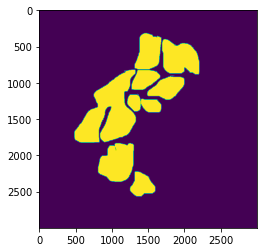

In [24]:
idx = 0
height, width, rle = df['img_height'][idx], df['img_width'][idx], df['rle'][idx]
mask = rle2mask(rle, shape=(height, width))
plt.imshow(mask)

In [25]:
from sklearn.model_selection import StratifiedKFold

df['fold'] = 0

skf = StratifiedKFold(n_splits=5)
for i, index in enumerate(skf.split(df.id, df.organ)):
  train_index, test_index = index
  # print("train_index:", train_index, "test_index:", test_index)
  # df['fold'][test_index] = i
  df.loc[test_index, 'fold'] = i

df

,id,organ,data_source,img_height,img_width,pixel_size,tissue_thickness,rle,age,sex,fold
0,10044,prostate,HPA,3000,3000,0.4,4,1459676 77 1462675 82 1465674 87 1468673 92 14...,37.0,Male,0
1,10274,prostate,HPA,3000,3000,0.4,4,715707 2 718705 8 721703 11 724701 18 727692 3...,76.0,Male,0
2,10392,spleen,HPA,3000,3000,0.4,4,1228631 20 1231629 24 1234624 40 1237623 47 12...,82.0,Male,0
3,10488,lung,HPA,3000,3000,0.4,4,3446519 15 3449517 17 3452514 20 3455510 24 34...,78.0,Male,0
4,10610,spleen,HPA,3000,3000,0.4,4,478925 68 481909 87 484893 105 487863 154 4908...,21.0,Female,0
...,...,...,...,...,...,...,...,...,...,...,...
346,9517,kidney,HPA,3000,3000,0.4,4,1611763 11 1614753 29 1617750 35 1620746 43 16...,61.0,Male,4
347,9769,kidney,HPA,3070,3070,0.4,4,4030400 28 4033466 34 4036526 48 4039594 54 40...,28.0,Male,4
348,9777,largeintestine,HPA,3000,3000,0.4,4,538473 13 541468 22 544463 30 547461 35 550459...,84.0,Male,4
349,9791,kidney,HPA,3000,3000,0.4,4,334733 33 337729 43 340729 43 343725 51 346723...,28.0,Male,4


## Utils

### augumentation

In [26]:
import staintools

In [27]:
class Stain(albu.ImageOnlyTransform):
    def __init__(
        self,
        method='vahadane', sigma1=0.2, sigma2=0.2,
        always_apply=False,
        p=0.5,
    ):
        super(Stain, self).__init__(always_apply, p)
        self.method = method
        self.sigma1 = sigma1
        self.sigma2 = sigma2
        self.augmentor = staintools.StainAugmentor(method=method, sigma1=sigma1, sigma2=sigma2)

    def apply(self, img, **params):
        self.augmentor.fit(img)
        return self.augmentor.pop().astype(int)

    def get_params(self):
        return {
        }

    def get_transform_init_args_names(self):
        return ("brightness_limit", "contrast_limit", "brightness_by_max")

In [28]:
# ----- set0
def get_training_augmentation_set0(p=0.5):
    return albu.Compose([
        albu.Sequential([
          albu.RandomScale(scale_limit=(-0.8, 0.0), interpolation=cv2.INTER_LINEAR, p=1),
          albu.Resize(HEIGHT, WIDTH, interpolation=cv2.INTER_LINEAR, p=1)
        ], p=p),
        albu.HorizontalFlip(p=p),
        albu.VerticalFlip(p=p),
        albu.RandomRotate90(p=p),
        albu.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=15, p=p, 
                         border_mode=cv2.BORDER_REFLECT),
        # albu.OneOf([
        #     albu.OpticalDistortion(p=1),
        #     albu.GridDistortion(p=1),
        #     albu.IAAPiecewiseAffine(p=1),
        # ], p=p),
        albu.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=p),
        albu.OneOf([
            albu.CLAHE(clip_limit=2, p = 1),
            albu.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.2, p=1),
            albu.HueSaturationValue (hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=1),
        ], p=p),
        albu.GaussNoise(var_limit=(10.0, 50.0), p=p),
    ], p=p)
# ---- set1
def get_training_augmentation_set1(p=0.5):
    return albu.Compose([
        albu.Sequential([
          albu.RandomScale(scale_limit=(-0.8, 0.0), interpolation=cv2.INTER_LINEAR, p=1),
          albu.Resize(HEIGHT, WIDTH, interpolation=cv2.INTER_LINEAR, p=1)
        ], p=p),
        albu.HorizontalFlip(p=p),
        albu.VerticalFlip(p=p),
        albu.RandomRotate90(p=p),
        # albu.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=15, p=p, 
        #                  border_mode=cv2.BORDER_REFLECT),
        albu.ShiftScaleRotate(shift_limit=0.2, scale_limit=0.2, rotate_limit=15, p=p, 
                         border_mode=cv2.BORDER_REFLECT),
        # albu.OneOf([
        #     albu.OpticalDistortion(p=1),
        #     albu.GridDistortion(p=1),
        #     albu.IAAPiecewiseAffine(p=1),
        # ], p=p),
        albu.ChannelShuffle(p=p),
        albu.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=p),
        albu.OneOf([
            albu.CLAHE(clip_limit=2, p = 1),
            albu.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.2, p=1),
            albu.HueSaturationValue (hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=1),
        ], p=p),
        albu.GaussNoise(var_limit=(10.0, 50.0), p=p),
    ], p=p)


In [29]:
def get_training_augmentation3(p=0.5):
    return albu.Compose([
        albu.Sequential([
          albu.RandomScale(scale_limit=(-0.8, 0.0), interpolation=cv2.INTER_LINEAR, p=1),
          albu.Resize(HEIGHT, WIDTH, interpolation=cv2.INTER_LINEAR, p=1)
        ], p=p),
        albu.HorizontalFlip(p=p),
        albu.VerticalFlip(p=p),
        albu.RandomRotate90(p=p),
        albu.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=15, p=p, 
                         border_mode=cv2.BORDER_REFLECT),
        # albu.OneOf([
        #     albu.OpticalDistortion(p=1),
        #     albu.GridDistortion(p=1),
        #     albu.IAAPiecewiseAffine(p=1),
        # ], p=p),
        albu.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=p),
        albu.OneOf([
            # albu.CLAHE(clip_limit=2, p = 1),
            albu.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.2, p=1),
            albu.HueSaturationValue (hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=1),
        ], p=p),
        albu.GaussNoise(var_limit=(10.0, 50.0), p=p),
        # albu.CoarseDropout (max_holes=50, max_height=16, max_width=16, p=p)
    ], p=p)

# def get_training_augmentation3(p=0.5):
#     return albu.Compose([
#         albu.Sequential([
#           albu.RandomScale(scale_limit=(-0.8, 0.0), interpolation=cv2.INTER_LINEAR, p=1),
#           albu.Resize(HEIGHT, WIDTH, interpolation=cv2.INTER_LINEAR, p=1)
#         ], p=p),
#         albu.HorizontalFlip(p=p),
#         albu.VerticalFlip(p=p),
#         albu.RandomRotate90(p=p),
#         albu.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=15, p=p, 
#                          border_mode=cv2.BORDER_REFLECT),
#         # albu.ShiftScaleRotate(shift_limit=0.2, scale_limit=0.2, rotate_limit=15, p=p, 
#         #                  border_mode=cv2.BORDER_REFLECT),
#         # albu.OneOf([
#         #     albu.OpticalDistortion(p=1),
#         #     albu.GridDistortion(p=1),
#         #     albu.IAAPiecewiseAffine(p=1),
#         # ], p=p),
#         albu.OneOf([
#             albu.ChannelShuffle(p=1),
#             albu.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=1),
#             albu.CLAHE(clip_limit=2, p = 1),
#             albu.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.2, p=1),
#             albu.HueSaturationValue (hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=1),
#         ], p=p),
#         albu.GaussNoise(var_limit=(10.0, 50.0), p=p),
#         albu.CoarseDropout (max_holes=50, max_height=16, max_width=16, p=p)
#     ], p=p)


In [30]:
def get_training_augmentation2(p=1.0):
    return albu.Compose([
        albu.HorizontalFlip(),
        albu.VerticalFlip(),
        albu.RandomRotate90(),
        albu.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=15, p=0.9, 
                         border_mode=cv2.BORDER_REFLECT),
        albu.OneOf([
            albu.OpticalDistortion(p=0.3),
            albu.GridDistortion(p=.1),
            albu.IAAPiecewiseAffine(p=0.3),
        ], p=0.3),
        albu.OneOf([
            # albu.HueSaturationValue(10,15,10),
            albu.CLAHE(clip_limit=2),
            albu.RandomBrightnessContrast(),            
        ], p=0.3),
        albu.GaussNoise(var_limit=(10.0, 50.0), p=0.3)
    ], p=p)

def get_training_augmentation():
    train_transform = [
        albu.PadIfNeeded(min_height=HEIGHT, min_width=WIDTH, always_apply=True, border_mode=0),
        albu.RandomCrop(height=HEIGHT, width=WIDTH, always_apply=True),
    ]
    return albu.Compose(train_transform)


def get_grayaug():
    train_transform = [
        albu.ToGray(p=1.0),
    ]
    return albu.Compose(train_transform)

# def get_validation_augmentation():
#     """画像のshapeが32で割り切れるようにPaddingするための関数"""
#     test_transform = [
#         albu.PadIfNeeded(384, 480)
#     ]
#     return albu.Compose(test_transform)

def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')

def get_preprocessing(preprocessing_fn):
    """Construct preprocessing transform    
    Args:
        preprocessing_fn (callbale): data normalization function 
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose    
    """
    
    _transform = [
        albu.Lambda(image=preprocessing_fn),
        albu.Lambda(image=to_tensor, mask=to_tensor),
    ]
    return albu.Compose(_transform)

# 可視化用の関数
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()

## dataset

In [31]:
from transformers import SegformerFeatureExtractor

mean = np.array([0.7720342, 0.74582646, 0.76392896])
std = np.array([0.24745085, 0.26182273, 0.25782376])

def img2tensor(img,dtype:np.dtype=np.float32):
    if img.ndim==2 : img = np.expand_dims(img,2)
    img = np.transpose(img,(2,0,1))
    return torch.from_numpy(img.astype(dtype, copy=False))


# 1. torch.utils.data.Datasetを継承したDataset classを定義
class Dataset(torch.utils.data.Dataset):
    # CLASSES = ['sky', 'building', 'pole', 'road', 'pavement', 
    #            'tree', 'signsymbol', 'fence', 'car', 
    #            'pedestrian', 'bicyclist', 'unlabelled']
    
    def __init__(
            self,
            image_dir, 
            df, # ファイル名一覧
            # classes=None, # 推論対象のクラス
            augmentation=None, # augmentation用関数
            preprocessing=None, # 前処理用関数
            width = 768,
            height = 768,
    ):
        self.image_dir = image_dir
        self.df = df
        self.augmentation = augmentation
        self.preprocessing = preprocessing
        self.width = width
        self.height = height
        self.feature_extractor = SegformerFeatureExtractor(MODEL_NAME , reduce_labels=False, size=(width, height))
    
    # 3. 学習用データ(image)と特徴(mask)を返す__getitem__メソッドを作成
    def __getitem__(self, i):
        # データの読み込み
        fname = "{}/{}.tiff".format(self.image_dir,self.df['id'][i])
        # print(fname)
        image = cv2.imread(fname)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        rle, w, h = self.df['rle'][i], self.df['img_width'][i], self.df['img_height'][i]
        idx = class2idx[self.df['organ'][i]]
        mask = rle2mask(rle, shape = (w, h))
        # print(self.df['organ'][i], idx)

        image = cv2.resize(image, (self.width, self.height))
        mask = cv2.resize(mask, (self.width, self.height)) * idx

        # augmentation関数の適用
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
        
        # print("image", image.shape)
        # # return image, mask
        # image = (image/255 - mean)/std
        
        # return img2tensor(image),torch.tensor(mask), idx
        # return image, mask
        encoded_inputs = self.feature_extractor(image, mask, return_tensors="pt")

        for k,v in encoded_inputs.items():
          encoded_inputs[k].squeeze_() # remove batch dimension

        return encoded_inputs

    # 4. データセットの長さを返す__len__を作成
    def __len__(self):
        return len(self.df)

torch.Size([3, 512, 512])


tensor([0, 1])

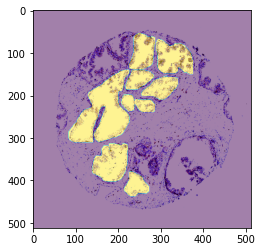

In [32]:
IMAGE_DIR = './hubmap/train_images'
train_dataset = Dataset(IMAGE_DIR, df[df['fold'] != FOLD].reset_index(), width=WIDTH, height=HEIGHT)
input = train_dataset[0]
print(input['pixel_values'].shape)
plt.imshow(input['pixel_values'].permute(1,2,0).numpy())
plt.imshow(input['labels'], alpha=0.5)
input['labels'].unique()

In [33]:
input

{'pixel_values': tensor([[[2.0777, 2.0777, 2.0605,  ..., 2.0777, 2.0777, 2.0777],
         [2.0777, 2.0777, 2.0777,  ..., 2.0777, 2.0777, 2.0777],
         [2.0263, 2.0777, 2.0777,  ..., 2.0777, 2.0777, 2.0777],
         ...,
         [2.0605, 2.0777, 2.0434,  ..., 2.0777, 2.0777, 2.0777],
         [2.0777, 2.0777, 2.0777,  ..., 2.0434, 2.0777, 2.0777],
         [2.0777, 2.0777, 2.0605,  ..., 2.0777, 2.0605, 2.0777]],

        [[2.2360, 2.2535, 2.2185,  ..., 2.2535, 2.2535, 2.2535],
         [2.2360, 2.2360, 2.2535,  ..., 2.2535, 2.2535, 2.2535],
         [2.2010, 2.2185, 2.2535,  ..., 2.2535, 2.2360, 2.2535],
         ...,
         [2.2535, 2.2360, 2.2360,  ..., 2.2535, 2.2535, 2.2535],
         [2.2535, 2.2360, 2.2535,  ..., 2.2535, 2.2360, 2.2535],
         [2.2360, 2.2535, 2.2360,  ..., 2.2360, 2.2360, 2.2535]],

        [[2.4657, 2.4657, 2.4483,  ..., 2.4657, 2.4657, 2.4657],
         [2.4657, 2.4657, 2.4657,  ..., 2.4657, 2.4483, 2.4657],
         [2.3786, 2.3960, 2.4483,  ..., 2

280


0 torch.Size([3, 512, 512])


0 torch.Size([3, 512, 512])


0 torch.Size([3, 512, 512])


0 torch.Size([3, 512, 512])


0 torch.Size([3, 512, 512])
0 torch.Size([3, 512, 512])


0 torch.Size([3, 512, 512])


0 torch.Size([3, 512, 512])


0 torch.Size([3, 512, 512])


0 torch.Size([3, 512, 512])


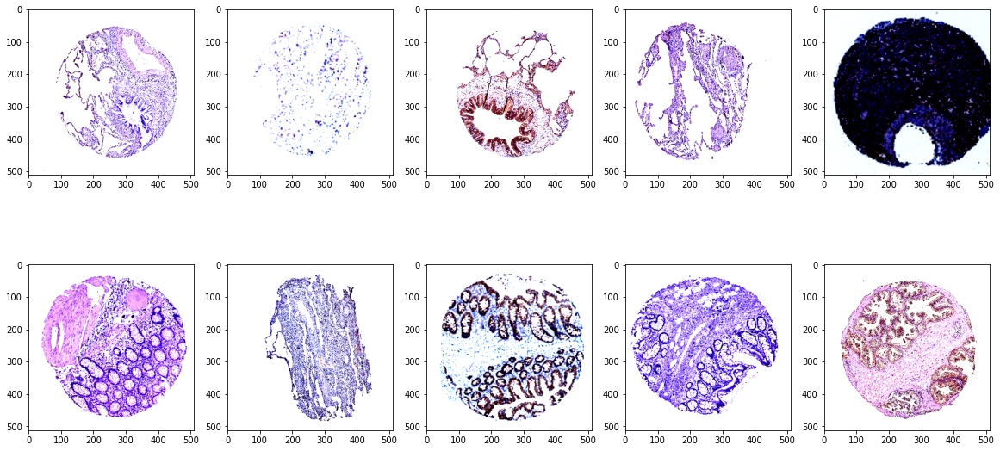

In [34]:
# # # データセットのインスタンスを作成
train_dataset = Dataset(IMAGE_DIR, df[df['fold'] != 0].reset_index(), 
                        width=WIDTH, height=HEIGHT,
                        augmentation=get_training_augmentation3(), 
                        )

plt.figure(figsize=(20, 10))

print(train_dataset.__len__())
for i in range(10) :
  input = train_dataset[i]
  print(idx, input.pixel_values.shape)
  plt.subplot(2, 5, i+1);
  plt.imshow(input['pixel_values'].permute(1,2,0).numpy())
  # plt.imshow(input['labels'], alpha=0.5)
plt.show()

In [35]:
from torch.utils.data import DataLoader
# CLASSES = ['car']


# データセットのインスタンスを作成
train_dataset = Dataset(IMAGE_DIR, df[df['fold'] != FOLD].reset_index(), 
                        width=WIDTH, height=HEIGHT,
                        augmentation=get_training_augmentation3(p=0.9), 
                        )
# train_dataset = Dataset(IMAGE_DIR, df.reset_index(), 
#                         width=WIDTH, height=HEIGHT,
#                         augmentation=get_training_augmentation3(p=0.9), 
#                         )

valid_dataset = Dataset(
    IMAGE_DIR, df[df['fold'] == FOLD].reset_index(), 
    width=WIDTH, height=HEIGHT,
    augmentation=None, 
)

# データローダーの作成
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
valid_loader = DataLoader(valid_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

0


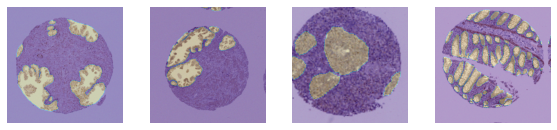

In [36]:
row, col = 8, 8
plt.figure(figsize=(20,20))

for inputs in train_loader:
  print(idx)
  data = inputs['pixel_values']
  mask = inputs['labels']
  for i in range(BATCH_SIZE) :
    plt.subplot(col, row, i+1)
    x = data[i].permute(1,2,0)
    plt.imshow((x-x.min())/(x.max()-x.min()))
    plt.imshow(mask[i], alpha=0.3)
    plt.axis('off')
  # print(data.shape)
  break

## ここまで前処理

In [37]:
from transformers import SegformerForSemanticSegmentation
# define model
model = SegformerForSemanticSegmentation.from_pretrained(MODEL_NAME,
                                                         num_labels=len(class2idx), 
                                                         id2label=idx2class, 
                                                         label2id=class2idx,
                                                         ignore_mismatched_sizes=True,
)

Some weights of the model checkpoint at nvidia/mit-b5 were not used when initializing SegformerForSemanticSegmentation: ['classifier.bias', 'classifier.weight']
- This IS expected if you are initializing SegformerForSemanticSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing SegformerForSemanticSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b5 and are newly initialized: ['decode_head.linear_c.2.proj.bias', 'decode_head.batch_norm.running_var', 'decode_head.batch_norm.bias', 'decode_head.linear_c.2.proj.weight', 'decode_head.linear_c.0.proj.weight', 'decode_head.batch

In [38]:
# # model_path = '/content/drive/MyDrive/datas/HuBMAP/model.pth'
# model_path_last = '/content/drive/MyDrive/datas/HuBMAP/last-fold{}.pth'.format(FOLD)
# model_path_last = '/content/drive/MyDrive/datas/HuBMAP/model-b5-fold{}.pth'.format(FOLD)

# model.load_state_dict(torch.load(model_path_last))

In [39]:
from datasets import load_metric

metric = load_metric("mean_iou")

In [40]:
test_df = df[df['fold'] == FOLD].reset_index()

def dice_coef(mask1, mask2):
    intersect = np.sum(mask1*mask2)
    sum1 = np.sum(mask1)
    sum2 = np.sum(mask2)
    dice = 2*intersect/(sum1+sum2)
    dice = np.mean(dice)
    return dice

def valid(model2) :
  model2.eval()
  dice = 0.0
  loss = 0.0
  for i in tqdm(range(len(test_df))) :
    id = test_df.id[i]
    fname = "/content/hubmap/train_images/{}.tiff".format(id)
    image = Image.open(fname)
    encoding = feature_extractor(image, return_tensors="pt")
    pixel_values = encoding.pixel_values.cuda()

    # print(pixel_values.shape)

    organ = test_df.organ[i]
    idx = class2idx[organ]

    rle = test_df.rle[i]
    height, width = test_df.img_height[i], test_df.img_width[i]
    gt = rle2mask(rle, shape = (height, width))
    gt2 = cv2.resize(gt, pixel_values.shape[-2:]) * idx

    label = torch.tensor(gt2).unsqueeze(0).long().cuda()

    # print(label.shape)

    with torch.no_grad():
      outputs = model2(pixel_values=pixel_values, labels=label)
      loss += outputs.loss.item()
      # print(outputs.loss, loss)
      upsampled_logits = nn.functional.interpolate(outputs['logits'],
                  # size=image.size[::-1], # (height, width)
                  (height, width),
                  mode='bilinear',
                  align_corners=False)
      mask = upsampled_logits.argmax(dim=1)[0]
      mask[mask != idx] = 0
      mask[mask == idx] = 1


    dice += dice_coef(mask.cpu().numpy(), gt)
  return dice/len(test_df), loss/len(test_df)

In [41]:
def read_model(file) :
  model = SegformerForSemanticSegmentation.from_pretrained(MODEL_NAME,
                                                          num_labels=len(class2idx), 
                                                          id2label=idx2class, 
                                                          label2id=class2idx,
                                                          ignore_mismatched_sizes=True,
  )
  model.load_state_dict(torch.load(file))
  model.cuda()
  model.eval()
  return model

def copy_params(model1, model2) :
  model1.load_state_dict(model2.state_dict())
  return model1

def sum_model_params(modelA, modelB):
    """ modelA + modelB """
    sdA = modelA.state_dict()
    sdB = modelB.state_dict()
    for key in sdA:
        sdA[key] = (sdA[key] + sdB[key])
    modelA.load_state_dict(sdA)
    return modelA

def multi_model_params(model, a):
    """ a * model """
    sd = model.state_dict()
    for key in sd:
        sd[key] = sd[key] * a
    model.load_state_dict(sd)
    return model

In [42]:
# import torch
# from torch import nn
# from sklearn.metrics import accuracy_score
# # from tqdm.notebook import tqdm
# # from tqdm import tqdm
# from fastprogress.fastprogress import  progress_bar as tqdm

# from PIL import Image
# from transformers import SegformerFeatureExtractor

# feature_extractor = SegformerFeatureExtractor(reduce_labels=False, size=(WIDTH, HEIGHT))
# model = model.cuda()
# valid(model)

In [43]:
# model_path_best = "/content/drive/MyDrive/datas/HuBMAP/merge-fold{}.pth".format(FOLD)
# model.load_state_dict(torch.load(model_path_best))

# model.load_state_dict(torch.load("/content/drive/MyDrive/datas/HuBmap-segformer/epoch250-fold1.pth"))

In [44]:
import copy
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

best_model = copy.deepcopy(model)
best_model.to(device)
best_model.eval()

tmp_model = copy.deepcopy(model).to(device).eval()

## TRAIN


In [45]:
import random

import torch
from torch import nn
from sklearn.metrics import accuracy_score
# from tqdm.notebook import tqdm
# from tqdm import tqdm
from fastprogress.fastprogress import  progress_bar as tqdm

from PIL import Image
from transformers import SegformerFeatureExtractor

writer = SummaryWriter(log_dir="./logs")
feature_extractor = SegformerFeatureExtractor(reduce_labels=False, size=(WIDTH, HEIGHT))
use_amp = True # ampをオンオフ


# define optimizer
# optimizer = torch.optim.AdamW(model.parameters(), lr=0.00006)
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4,  weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size = 50, gamma=0.9)

# move model to GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

scaler = torch.cuda.amp.GradScaler(enabled=use_amp)

# scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer, 
#                                               base_lr=1e-5,
#                                               max_lr=1e-3,
#                                               step_size_up=20,
#                                               step_size_down=30,
#                                               mode="triangular2",
#                                               cycle_momentum=False,
#                                               gamma=0.95)


model.train()
print("best model")
cur_loss,_ = valid(best_model)
print("dice = ", cur_loss)
best_epoch = 0
for epoch in range(400):  # loop over the dataset multiple times
   print("Epoch:", epoch)
   
   model.train()
   optimizer.zero_grad()

   tot_loss = 0.0
   for idx, batch in enumerate(tqdm(train_loader)):
        # get the inputs;
        pixel_values = batch["pixel_values"].to(device)
        labels = batch["labels"].to(device)

        # print(pixel_values.shape, labels.shape)

        # zero the parameter gradients
        with torch.cuda.amp.autocast(enabled=use_amp):
            # forward + backward + optimize
            outputs = model(pixel_values=pixel_values, labels=labels)
            loss, logits = outputs.loss, outputs.logits

        tot_loss += loss.detach().cpu().numpy()
        
        scaler.scale(loss).backward()

        if (idx + 1) % Gradient_Accumulation_Step == 0 or idx == len(train_loader) :
            # optimizer.step()
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()

   scheduler.step()

   print("Loss:", tot_loss/len(train_loader))

   print("valid...")

   dice,valid_loss = valid(model)

   writer.add_scalars("loss", {
       "train": tot_loss/len(train_loader),
       "valid": valid_loss,
       }, epoch+1)  
   writer.add_scalar("lr", scheduler.get_last_lr()[0], epoch+1)
   
   if dice > cur_loss :
     cur_loss = dice
     best_epoch = epoch
     print("update best dice = ", dice, "loss = ", valid_loss)
     torch.save(model.state_dict(), model_path)
     best_model = copy_params(best_model, model)
  #  elif random.random() >= 0.5:
  #    tmp_model = copy_params(tmp_model, best_model)
  #    tmp_model = sum_model_params(tmp_model, model)
  #    tmp_model = multi_model_params(tmp_model, 1/2)
  #    tmp_dice, tmp_valid_loss = valid(tmp_model)
  #    print("dice = ", dice , "tmp = ", tmp_dice, "best = ", cur_loss)
  #    if tmp_dice > cur_loss :
  #       cur_loss = tmp_dice
  #       best_epoch = epoch
  #       model = copy_params(model, tmp_model)
  #       best_model = copy_params(best_model, model)
  #       print("update best dice = ", tmp_dice, "loss = ", tmp_valid_loss, "best <- tmp_model")
  #       torch.save(model.state_dict(), model_path)  
  #    else:
  #      if tmp_dice > dice :
  #        model = copy_params(model, tmp_model)
  #        print("epoch dice = ", tmp_dice, "loss = ", tmp_valid_loss, "model <- tmp_model")
  #      else:
  #        print("epoch dice = ", dice, "loss = ", valid_loss)
   else :
         print("epoch dice = ", dice, "loss = ", valid_loss, "p<0.5")

   if epoch >= 100 and epoch%50 == 0 :
      model_path_last = '/content/drive/MyDrive/datas/HuBmap-segformer/epoch{}-fold{}.pth'.format(epoch, FOLD)
      torch.save(model.state_dict(), model_path_last)
         
   wandb.log({'epoch': epoch, 'train_loss': tot_loss/len(train_loader), "valid_loss": valid_loss, 
              "dice": dice, "lr":scheduler.get_last_lr()[0], "best dice": cur_loss, "best epoch": best_epoch})


writer.close()
wandb.save(model_path)

best model


dice =  0.08857484752783137
Epoch: 0


Loss: 1.4249115863316495
valid...


update best dice =  0.34631883575720634 loss =  0.7654726999146598
Epoch: 1


Loss: 0.7970063627605707
valid...


update best dice =  0.4444335079298549 loss =  0.6156292110681534
Epoch: 2


Loss: 0.5313948476818245
valid...


update best dice =  0.5773942641939538 loss =  0.3993909646357809
Epoch: 3


Loss: 0.38067795797972614
valid...


update best dice =  0.6114726373450509 loss =  0.3250018239021301
Epoch: 4


Loss: 0.3043641380860772
valid...


update best dice =  0.6346564005961717 loss =  0.25297632951821597
Epoch: 5


Loss: 0.2543294528420542
valid...


update best dice =  0.6454951290568086 loss =  0.19839408333812442
Epoch: 6


Loss: 0.21286338441808458
valid...


update best dice =  0.6673454053528867 loss =  0.17367785509143557
Epoch: 7


Loss: 0.19639152928557194
valid...


epoch dice =  0.6393455346025217 loss =  0.16418545714446475 p<0.5
Epoch: 8


Loss: 0.1758632858244466
valid...


update best dice =  0.6864472836903305 loss =  0.15021366769714015
Epoch: 9


Loss: 0.17078834530753148
valid...


epoch dice =  0.681083800292715 loss =  0.1478986659220287 p<0.5
Epoch: 10


Loss: 0.1564162556134479
valid...


epoch dice =  0.6846979194535544 loss =  0.1325726327087198 p<0.5
Epoch: 11


Loss: 0.149159382451588
valid...


update best dice =  0.6975123465405533 loss =  0.13082929088601045
Epoch: 12


Loss: 0.13743636117015087
valid...


epoch dice =  0.6948899148994757 loss =  0.12923952426229204 p<0.5
Epoch: 13


Loss: 0.1318422178672233
valid...


epoch dice =  0.695384289750969 loss =  0.12594677414745092 p<0.5
Epoch: 14


Loss: 0.13752381608519756
valid...


epoch dice =  0.6805575387480601 loss =  0.11361091336501496 p<0.5
Epoch: 15


Loss: 0.1266949404503258
valid...


epoch dice =  0.690618180687814 loss =  0.11628237632768494 p<0.5
Epoch: 16


Loss: 0.12127183398730318
valid...


epoch dice =  0.696392876165201 loss =  0.11728631540068558 p<0.5
Epoch: 17


Loss: 0.11865567248052275
valid...


update best dice =  0.6976868627294576 loss =  0.12059872546898467
Epoch: 18


Loss: 0.11589314662654635
valid...


update best dice =  0.699247859757422 loss =  0.11536467777831214
Epoch: 19


Loss: 0.11425640549458249
valid...


epoch dice =  0.691532382532848 loss =  0.121839714422822 p<0.5
Epoch: 20


Loss: 0.10750331031814428
valid...


update best dice =  0.7057677663243277 loss =  0.11522640234657697
Epoch: 21


Loss: 0.10893689463256111
valid...


epoch dice =  0.7053038442025935 loss =  0.10867932220654829 p<0.5
Epoch: 22


Loss: 0.10320815543683481
valid...


epoch dice =  0.7021816039781047 loss =  0.11023571509867906 p<0.5
Epoch: 23


Loss: 0.09661128744482994
valid...


update best dice =  0.7080680303521867 loss =  0.11008579814806581
Epoch: 24


Loss: 0.10083302997157607
valid...


epoch dice =  0.6968713012147353 loss =  0.10237520355731249 p<0.5
Epoch: 25


Loss: 0.09824859817892732
valid...


epoch dice =  0.6967825016848698 loss =  0.09992284246587328 p<0.5
Epoch: 26


Loss: 0.09251032098078392
valid...


update best dice =  0.7130298296449951 loss =  0.09865028419132743
Epoch: 27


Loss: 0.09278770641122065
valid...


update best dice =  0.7149642109888392 loss =  0.10217440149613789
Epoch: 28


Loss: 0.09029044934981306
valid...


epoch dice =  0.7020752458473617 loss =  0.09973523507692984 p<0.5
Epoch: 29


Loss: 0.08668003672025573
valid...


update best dice =  0.7277406603844757 loss =  0.1030928644085569
Epoch: 30


Loss: 0.093280344047177
valid...


epoch dice =  0.6964597164230283 loss =  0.10631356484123639 p<0.5
Epoch: 31


Loss: 0.09461190226212354
valid...


epoch dice =  0.7234590908200588 loss =  0.10629592388868332 p<0.5
Epoch: 32


Loss: 0.08572949760291777
valid...


epoch dice =  0.7148811059369432 loss =  0.10086864629494292 p<0.5
Epoch: 33


Loss: 0.083658799371669
valid...


epoch dice =  0.7126291651694266 loss =  0.09621948927108731 p<0.5
Epoch: 34


Loss: 0.08398830150844346
valid...


epoch dice =  0.7126647547111916 loss =  0.09491479571110435 p<0.5
Epoch: 35


Loss: 0.08758615434799395
valid...


epoch dice =  0.7065194814164709 loss =  0.09929836627894215 p<0.5
Epoch: 36


Loss: 0.08465958171537225
valid...


epoch dice =  0.7187118790998657 loss =  0.09884617722460202 p<0.5
Epoch: 37


Loss: 0.08432380422215227
valid...


epoch dice =  0.7259262613201238 loss =  0.0932764467384134 p<0.5
Epoch: 38


Loss: 0.07613953622713895
valid...


epoch dice =  0.7217417717317057 loss =  0.09790111905229944 p<0.5
Epoch: 39


Loss: 0.07993450577200299
valid...


epoch dice =  0.715390568141894 loss =  0.09852210152894258 p<0.5
Epoch: 40


Loss: 0.07825513745487576
valid...


epoch dice =  0.7274125574569852 loss =  0.09374181773247463 p<0.5
Epoch: 41


Loss: 0.07741649412143399
valid...


epoch dice =  0.7185908728541484 loss =  0.09698075384699872 p<0.5
Epoch: 42


Loss: 0.07571194011350753
valid...


epoch dice =  0.7144216409902202 loss =  0.09579034273379615 p<0.5
Epoch: 43


Loss: 0.07657684370035857
valid...


epoch dice =  0.7226018216976211 loss =  0.09099983188456723 p<0.5
Epoch: 44


Loss: 0.07615576831387802
valid...


epoch dice =  0.7253272414825036 loss =  0.09408449877851775 p<0.5
Epoch: 45


Loss: 0.07765902820187555
valid...


update best dice =  0.7436578484291129 loss =  0.09613836862679039
Epoch: 46


Loss: 0.07444922418766459
valid...


epoch dice =  0.7228388494877626 loss =  0.09404760046995111 p<0.5
Epoch: 47


Loss: 0.07131390396872876
valid...


epoch dice =  0.7290650498360686 loss =  0.10526823680847883 p<0.5
Epoch: 48


Loss: 0.07349789063905326
valid...


epoch dice =  0.7303201941342438 loss =  0.09211546795974884 p<0.5
Epoch: 49


Loss: 0.07149728453180319
valid...


epoch dice =  0.7289126148411172 loss =  0.09065346189641527 p<0.5
Epoch: 50


Loss: 0.06984626331274778
valid...


epoch dice =  0.7353440776572715 loss =  0.09861442541171397 p<0.5
Epoch: 51


Loss: 0.06621366343133046
valid...


epoch dice =  0.7372514700481062 loss =  0.09431284618164812 p<0.5
Epoch: 52


Loss: 0.06947542745357668
valid...


epoch dice =  0.7404489779167888 loss =  0.09354179080442658 p<0.5
Epoch: 53


Loss: 0.06841721537877136
valid...


epoch dice =  0.7339685841636561 loss =  0.09205353039183788 p<0.5
Epoch: 54


Loss: 0.06467371213604027
valid...


epoch dice =  0.7280664198688177 loss =  0.09431973122326391 p<0.5
Epoch: 55


Loss: 0.06429896939178588
valid...


epoch dice =  0.7260474558408325 loss =  0.09859305678733758 p<0.5
Epoch: 56


Loss: 0.06468947837785097
valid...


update best dice =  0.747948115137404 loss =  0.09574385272738124
Epoch: 57


Loss: 0.06583099229864671
valid...


epoch dice =  0.731303837695334 loss =  0.10132955685923142 p<0.5
Epoch: 58


Loss: 0.06556981539642306
valid...


epoch dice =  0.7425515802338265 loss =  0.10085594610178045 p<0.5
Epoch: 59


Loss: 0.06398308180062703
valid...


epoch dice =  0.7475197767063518 loss =  0.10169915431844337 p<0.5
Epoch: 60


Loss: 0.0625187974475639
valid...


epoch dice =  0.7443301033172562 loss =  0.0947940460672336 p<0.5
Epoch: 61


Loss: 0.06554299031554812
valid...


epoch dice =  0.7397535093159693 loss =  0.09068007449220333 p<0.5
Epoch: 62


Loss: 0.06365387918243945
valid...


epoch dice =  0.7323940718883666 loss =  0.10048402229856168 p<0.5
Epoch: 63


Loss: 0.06398697462405117
valid...


epoch dice =  0.7398962912325875 loss =  0.0922781749362392 p<0.5
Epoch: 64


Loss: 0.06383462761804251
valid...


update best dice =  0.7507585514178859 loss =  0.09654784438732479
Epoch: 65


Loss: 0.062437968433532914
valid...


epoch dice =  0.738163816376371 loss =  0.09530331255601986 p<0.5
Epoch: 66


Loss: 0.06060717165679999
valid...


epoch dice =  0.7451209639959141 loss =  0.10167302716789502 p<0.5
Epoch: 67


Loss: 0.06269491909885071
valid...


epoch dice =  0.726033964362219 loss =  0.09736278431623109 p<0.5
Epoch: 68


Loss: 0.06337034631468041
valid...


epoch dice =  0.7505656501998004 loss =  0.0983683056996337 p<0.5
Epoch: 69


Loss: 0.06331791350959053
valid...


epoch dice =  0.7491742090987954 loss =  0.09784034809895924 p<0.5
Epoch: 70


Loss: 0.06135157558699729
valid...


epoch dice =  0.7493529465168096 loss =  0.09967136532068252 p<0.5
Epoch: 71


Loss: 0.06281750965338777
valid...


epoch dice =  0.7496106692474369 loss =  0.09971244304573962 p<0.5
Epoch: 72


Loss: 0.060493410814186216
valid...


epoch dice =  0.7461459700477033 loss =  0.10031120916163283 p<0.5
Epoch: 73


Loss: 0.05777383189071232
valid...


epoch dice =  0.7434831617775501 loss =  0.09324031645831253 p<0.5
Epoch: 74


Loss: 0.05740253779460007
valid...


epoch dice =  0.7502343054544038 loss =  0.09672358113873218 p<0.5
Epoch: 75


Loss: 0.0581337646909163
valid...


epoch dice =  0.736582482571039 loss =  0.09390759711552943 p<0.5
Epoch: 76


Loss: 0.05733291023004223
valid...


epoch dice =  0.7409529935313585 loss =  0.09390872905163893 p<0.5
Epoch: 77


Loss: 0.060512652122218846
valid...


epoch dice =  0.7386298009651048 loss =  0.09337865196035376 p<0.5
Epoch: 78


Loss: 0.05714050614812844
valid...


epoch dice =  0.7459877498053882 loss =  0.09419910069555044 p<0.5
Epoch: 79


Loss: 0.062491460821368326
valid...


epoch dice =  0.7276673398883593 loss =  0.09274287141327348 p<0.5
Epoch: 80


Loss: 0.06027467706253831
valid...


epoch dice =  0.7430584286868247 loss =  0.09634557818727833 p<0.5
Epoch: 81


Loss: 0.056574734583706925
valid...


epoch dice =  0.7299528991345076 loss =  0.0998378657602838 p<0.5
Epoch: 82


Loss: 0.05744798366032856
valid...


epoch dice =  0.7474233055506178 loss =  0.10091661913985653 p<0.5
Epoch: 83


Loss: 0.059918909228708545
valid...


epoch dice =  0.7496816144299943 loss =  0.09871849987788923 p<0.5
Epoch: 84


Loss: 0.06020889361716912
valid...


epoch dice =  0.7465351210481005 loss =  0.10741561921313406 p<0.5
Epoch: 85


Loss: 0.058001668336735646
valid...


epoch dice =  0.7395533231742829 loss =  0.10071741604645337 p<0.5
Epoch: 86


Loss: 0.0586628536103477
valid...


epoch dice =  0.7376302264543029 loss =  0.09841424987784454 p<0.5
Epoch: 87


Loss: 0.05449129158342388
valid...


epoch dice =  0.7440944653219458 loss =  0.0971829651322748 p<0.5
Epoch: 88


Loss: 0.055718771273821174
valid...


epoch dice =  0.7376684951667642 loss =  0.09626174291063633 p<0.5
Epoch: 89


Loss: 0.05586869998926848
valid...


epoch dice =  0.743540276385013 loss =  0.09803000287418918 p<0.5
Epoch: 90


Loss: 0.05675706443127612
valid...


epoch dice =  0.7448478493750083 loss =  0.10247683362769229 p<0.5
Epoch: 91


Loss: 0.05876624130342208
valid...


epoch dice =  0.720699430466686 loss =  0.10162220873337771 p<0.5
Epoch: 92


Loss: 0.059824897842088214
valid...


epoch dice =  0.7334660836662034 loss =  0.09874653769657016 p<0.5
Epoch: 93


Loss: 0.06058926179900136
valid...


epoch dice =  0.7407363004603662 loss =  0.10106642282834011 p<0.5
Epoch: 94


Loss: 0.05725095460427479
valid...


epoch dice =  0.7344452715017301 loss =  0.10210283381332244 p<0.5
Epoch: 95


Loss: 0.054191167085943084
valid...


epoch dice =  0.7354340225023072 loss =  0.09751383712116096 p<0.5
Epoch: 96


Loss: 0.05474898714939473
valid...


epoch dice =  0.7454818201974859 loss =  0.09741596062002437 p<0.5
Epoch: 97


Loss: 0.051866843155257296
valid...


epoch dice =  0.7368635295468262 loss =  0.10055172403476068 p<0.5
Epoch: 98


Loss: 0.05398376293900147
valid...


epoch dice =  0.7479138322549451 loss =  0.0982936561905912 p<0.5
Epoch: 99


Loss: 0.052650124490470955
valid...


epoch dice =  0.742170717176848 loss =  0.10295839944987424 p<0.5
Epoch: 100


Loss: 0.0538680383174772
valid...


epoch dice =  0.7440685690576699 loss =  0.10338495832069644 p<0.5
Epoch: 101


Loss: 0.05435737353605284
valid...


update best dice =  0.7531221584969785 loss =  0.09851771983584123
Epoch: 102


Loss: 0.05206237129972015
valid...


epoch dice =  0.7340034440330788 loss =  0.09743536040852112 p<0.5
Epoch: 103


Loss: 0.051412985620784085
valid...


epoch dice =  0.7304479597421368 loss =  0.10268664077988693 p<0.5
Epoch: 104


Loss: 0.05553916188507852
valid...


epoch dice =  0.7485537541479061 loss =  0.10053605973454459 p<0.5
Epoch: 105


Loss: 0.05409009253579966
valid...


epoch dice =  0.7467246211790144 loss =  0.10377777522163732 p<0.5
Epoch: 106


Loss: 0.055846496629463116
valid...


epoch dice =  0.7448933167773333 loss =  0.09874962149187923 p<0.5
Epoch: 107


Loss: 0.05337912851000126
valid...


epoch dice =  0.7410506589652124 loss =  0.09967689297960274 p<0.5
Epoch: 108


Loss: 0.050576258713090926
valid...


epoch dice =  0.7355846996115994 loss =  0.1010410840889173 p<0.5
Epoch: 109


Loss: 0.0573539309938189
valid...


epoch dice =  0.7451188791555415 loss =  0.09755656057303505 p<0.5
Epoch: 110


Loss: 0.05054292642891827
valid...


update best dice =  0.7552757111197205 loss =  0.09809771799482406
Epoch: 111


Loss: 0.052735078384653786
valid...


epoch dice =  0.7414147111425297 loss =  0.10352332155619348 p<0.5
Epoch: 112


Loss: 0.05389899902150665
valid...


epoch dice =  0.7509263157633129 loss =  0.1074374563326793 p<0.5
Epoch: 113


Loss: 0.04984454915557109
valid...


epoch dice =  0.7433300351682044 loss =  0.10986776657934699 p<0.5
Epoch: 114


Loss: 0.051646171111456106
valid...


epoch dice =  0.7508270408368672 loss =  0.10101314401919288 p<0.5
Epoch: 115


Loss: 0.051653054988824984
valid...


epoch dice =  0.7395295932998346 loss =  0.10635341222930167 p<0.5
Epoch: 116


Loss: 0.050259882072642655
valid...


epoch dice =  0.7445300788510602 loss =  0.10493753676834916 p<0.5
Epoch: 117


Loss: 0.050025461287513166
valid...


epoch dice =  0.7417478620490403 loss =  0.10418450126557478 p<0.5
Epoch: 118


Loss: 0.05070933130320529
valid...


epoch dice =  0.7399270515362771 loss =  0.10411902647465468 p<0.5
Epoch: 119


Loss: 0.05177984767081872
valid...


epoch dice =  0.7524571665706807 loss =  0.10317938993019717 p<0.5
Epoch: 120


Loss: 0.04948614145511053
valid...


epoch dice =  0.7438213776217174 loss =  0.103000526229984 p<0.5
Epoch: 121


Loss: 0.051347951168640396
valid...


epoch dice =  0.7364379466784071 loss =  0.11507667539242122 p<0.5
Epoch: 122


Loss: 0.05036123765921089
valid...


epoch dice =  0.7447352515405142 loss =  0.10049525246556316 p<0.5
Epoch: 123


Loss: 0.04893732777940975
valid...


epoch dice =  0.7507759045744039 loss =  0.10259499285104019 p<0.5
Epoch: 124


Loss: 0.050109496904196034
valid...


epoch dice =  0.7376476009028118 loss =  0.10473318437912635 p<0.5
Epoch: 125


Loss: 0.049437039800670365
valid...


epoch dice =  0.7430339820918075 loss =  0.10231019756091493 p<0.5
Epoch: 126


Loss: 0.05050483660798677
valid...


epoch dice =  0.7468132760448422 loss =  0.10798872316123119 p<0.5
Epoch: 127


Loss: 0.048254470314673135
valid...


epoch dice =  0.7398556242232274 loss =  0.10822030089662543 p<0.5
Epoch: 128


Loss: 0.047291574829166204
valid...


epoch dice =  0.7494010468528672 loss =  0.10413356121363385 p<0.5
Epoch: 129


Loss: 0.049524692464357534
valid...


epoch dice =  0.753539013527411 loss =  0.10098218730251704 p<0.5
Epoch: 130


Loss: 0.050039426908946374
valid...


epoch dice =  0.7469842348880512 loss =  0.10680950013255434 p<0.5
Epoch: 131


Loss: 0.05203684945394036
valid...


epoch dice =  0.7477421464441855 loss =  0.10591454938985408 p<0.5
Epoch: 132


Loss: 0.04735659781686017
valid...


epoch dice =  0.7489631801839105 loss =  0.09780610426595168 p<0.5
Epoch: 133


Loss: 0.04767460929570903
valid...


epoch dice =  0.7425528085628096 loss =  0.10684877002079572 p<0.5
Epoch: 134


Loss: 0.046676701852973075
valid...


epoch dice =  0.7537661878829844 loss =  0.10199552952045841 p<0.5
Epoch: 135


Loss: 0.05185042641742129
valid...


epoch dice =  0.7428533338377378 loss =  0.10000239732409162 p<0.5
Epoch: 136


Loss: 0.050368690495969544
valid...


epoch dice =  0.7510759455040408 loss =  0.10417583252170257 p<0.5
Epoch: 137


Loss: 0.049453716751345446
valid...


epoch dice =  0.7512117948172464 loss =  0.10445568914126073 p<0.5
Epoch: 138


Loss: 0.04985780224309001
valid...


epoch dice =  0.7467527435196918 loss =  0.10442787139410419 p<0.5
Epoch: 139


Loss: 0.048845764144625464
valid...


epoch dice =  0.7495903574084555 loss =  0.10593188444618136 p<0.5
Epoch: 140


Loss: 0.050743529586200146
valid...


epoch dice =  0.7468769399012273 loss =  0.10489478425255844 p<0.5
Epoch: 141


Loss: 0.046103483079080014
valid...


epoch dice =  0.7514088454932346 loss =  0.1019816572777927 p<0.5
Epoch: 142


Loss: 0.04589261824238888
valid...


epoch dice =  0.7536935984305635 loss =  0.10703766741124647 p<0.5
Epoch: 143


Loss: 0.04677139033733959
valid...


epoch dice =  0.7430715340206256 loss =  0.10335321447678975 p<0.5
Epoch: 144


Loss: 0.04612291198958394
valid...


epoch dice =  0.749475702984612 loss =  0.10504718884559615 p<0.5
Epoch: 145


Loss: 0.04568611557634784
valid...


epoch dice =  0.748059072656766 loss =  0.10510990059868033 p<0.5
Epoch: 146


Loss: 0.047233112169508366
valid...


epoch dice =  0.7546921752157507 loss =  0.10339006818830968 p<0.5
Epoch: 147


Loss: 0.04470544023780336
valid...


epoch dice =  0.7472036502719547 loss =  0.10636807405722461 p<0.5
Epoch: 148


Loss: 0.04724208286530535
valid...


epoch dice =  0.7468408390272148 loss =  0.10477509359563035 p<0.5
Epoch: 149


Loss: 0.04603283524408307
valid...


epoch dice =  0.7536508990240376 loss =  0.1049040944049401 p<0.5
Epoch: 150


Loss: 0.045770812792782216
valid...


epoch dice =  0.7487458355850377 loss =  0.10773805008668985 p<0.5
Epoch: 151


Loss: 0.04464913739389937
valid...


epoch dice =  0.7480858523262149 loss =  0.10719526609006737 p<0.5
Epoch: 152


Loss: 0.04515913517122537
valid...


epoch dice =  0.7467691537764787 loss =  0.10751085852139762 p<0.5
Epoch: 153


Loss: 0.04544049632591261
valid...


epoch dice =  0.7504679592919473 loss =  0.10249762067438237 p<0.5
Epoch: 154


Loss: 0.04820476783255876
valid...


epoch dice =  0.7478891753154929 loss =  0.10714505278239293 p<0.5
Epoch: 155


Loss: 0.045095423918584704
valid...


epoch dice =  0.751607208172786 loss =  0.10479922783228436 p<0.5
Epoch: 156


Loss: 0.045487325428657126
valid...


update best dice =  0.7553602892966225 loss =  0.10301608588945653
Epoch: 157


Loss: 0.04488755563195323
valid...


epoch dice =  0.7485746957299764 loss =  0.11402023468565728 p<0.5
Epoch: 158


Loss: 0.04562801125288849
valid...


epoch dice =  0.7512975813961756 loss =  0.10727442631032318 p<0.5
Epoch: 159


Loss: 0.04605701620834814
valid...


epoch dice =  0.7519032461571364 loss =  0.10453563000607703 p<0.5
Epoch: 160


Loss: 0.04463924840092659
valid...


epoch dice =  0.7525170404568114 loss =  0.10197336955794266 p<0.5
Epoch: 161


Loss: 0.04448617845249008
valid...


epoch dice =  0.7537429326689524 loss =  0.10441300637487855 p<0.5
Epoch: 162


Loss: 0.04508818178372064
valid...


update best dice =  0.7578968384265167 loss =  0.10280892261570053
Epoch: 163


Loss: 0.044953120596916744
valid...


epoch dice =  0.7524758152582702 loss =  0.10129432096146047 p<0.5
Epoch: 164


Loss: 0.044686602284266075
valid...


epoch dice =  0.7552573853619916 loss =  0.10432286245881446 p<0.5
Epoch: 165


Loss: 0.043015339293740164
valid...


epoch dice =  0.7525922614909216 loss =  0.10461818637725498 p<0.5
Epoch: 166


Loss: 0.0457635212978217
valid...


epoch dice =  0.7500266803310112 loss =  0.11068774902461363 p<0.5
Epoch: 167


Loss: 0.0436779284377543
valid...


epoch dice =  0.7463396384415623 loss =  0.10853412966243922 p<0.5
Epoch: 168


Loss: 0.04457646250252573
valid...


epoch dice =  0.7522489092718966 loss =  0.10350035840445863 p<0.5
Epoch: 169


Loss: 0.04371831939936104
valid...


epoch dice =  0.7416780790943147 loss =  0.10971260094083846 p<0.5
Epoch: 170


Loss: 0.04784677973882833
valid...


epoch dice =  0.7537585079141569 loss =  0.11050566896530134 p<0.5
Epoch: 171


Loss: 0.044868854753358264
valid...


epoch dice =  0.7505752885012911 loss =  0.10879994800447353 p<0.5
Epoch: 172


Loss: 0.04395529389066596
valid...


epoch dice =  0.753696479716071 loss =  0.10588435215010707 p<0.5
Epoch: 173


Loss: 0.04578418545687283
valid...


epoch dice =  0.7523920792399239 loss =  0.10367742168850132 p<0.5
Epoch: 174


Loss: 0.04609519739071248
valid...


epoch dice =  0.7475866831799947 loss =  0.11314659174531698 p<0.5
Epoch: 175


Loss: 0.05054656233848401
valid...


epoch dice =  0.7458633396300992 loss =  0.10627579746235694 p<0.5
Epoch: 176


Loss: 0.045712544648370275
valid...


epoch dice =  0.7540684621457742 loss =  0.10505953620720122 p<0.5
Epoch: 177


Loss: 0.04369839072279947
valid...


update best dice =  0.7586718035830765 loss =  0.10741943826100656
Epoch: 178


Loss: 0.04236486345582025
valid...


update best dice =  0.7589930904091471 loss =  0.11160946995951235
Epoch: 179


Loss: 0.047441213863941144
valid...


epoch dice =  0.7554600732408633 loss =  0.10845766818550016 p<0.5
Epoch: 180


Loss: 0.042956184031782856
valid...


epoch dice =  0.7512982216513161 loss =  0.10612673017728541 p<0.5
Epoch: 181


Loss: 0.04405395181613489
valid...


epoch dice =  0.7477692915159027 loss =  0.10954974589071104 p<0.5
Epoch: 182


Loss: 0.04436537037065751
valid...


epoch dice =  0.7499696124308134 loss =  0.10966956278841411 p<0.5
Epoch: 183


Loss: 0.04502764190743926
valid...


epoch dice =  0.7537137019997644 loss =  0.1120891927874514 p<0.5
Epoch: 184


Loss: 0.0457182320648096
valid...


epoch dice =  0.7547270875041671 loss =  0.11092376386347626 p<0.5
Epoch: 185


Loss: 0.0441332580652875
valid...


epoch dice =  0.7519742936901839 loss =  0.11063898519080664 p<0.5
Epoch: 186


Loss: 0.042614236310071926
valid...


epoch dice =  0.7499064524980309 loss =  0.11089762289941843 p<0.5
Epoch: 187


Loss: 0.04291509659829694
valid...


epoch dice =  0.7520971971180719 loss =  0.10794083651022188 p<0.5
Epoch: 188


Loss: 0.04348413694754873
valid...


epoch dice =  0.751472696914729 loss =  0.10855519303253719 p<0.5
Epoch: 189


Loss: 0.04376386672678128
valid...


epoch dice =  0.747809303469474 loss =  0.11167701965730105 p<0.5
Epoch: 190


Loss: 0.043524238936812946
valid...


epoch dice =  0.7482687195007203 loss =  0.11743827541358769 p<0.5
Epoch: 191


Loss: 0.04602911419064646
valid...


epoch dice =  0.7509279762959584 loss =  0.1021416537530188 p<0.5
Epoch: 192


Loss: 0.04716762782297504
valid...


epoch dice =  0.7561263529244505 loss =  0.11257881472951599 p<0.5
Epoch: 193


Loss: 0.04335382862777357
valid...


epoch dice =  0.7483130561828762 loss =  0.11422666358495397 p<0.5
Epoch: 194


Loss: 0.04425911862455623
valid...


epoch dice =  0.74858045912272 loss =  0.11009396203527493 p<0.5
Epoch: 195


Loss: 0.043194157582983166
valid...


epoch dice =  0.7554345473084175 loss =  0.10589981015904673 p<0.5
Epoch: 196


Loss: 0.04326462034385284
valid...


epoch dice =  0.7487906066978122 loss =  0.10862384212003755 p<0.5
Epoch: 197


Loss: 0.04226532009181003
valid...


epoch dice =  0.7466377668654075 loss =  0.11502211026714317 p<0.5
Epoch: 198


Loss: 0.04319410308749533
valid...


epoch dice =  0.7583977767235174 loss =  0.10834206727200321 p<0.5
Epoch: 199


Loss: 0.04415296121093799
valid...


epoch dice =  0.7486056586767297 loss =  0.11028534830547869 p<0.5
Epoch: 200


Loss: 0.0434153741094428
valid...


epoch dice =  0.7546368715819928 loss =  0.11363848825650556 p<0.5
Epoch: 201


Loss: 0.04231549101606221
valid...


epoch dice =  0.7483432391969139 loss =  0.10946518607171518 p<0.5
Epoch: 202


Loss: 0.042764525939251334
valid...


epoch dice =  0.7512691420364936 loss =  0.11593997108616999 p<0.5
Epoch: 203


Loss: 0.042829735624328465
valid...


epoch dice =  0.7527610129217217 loss =  0.1118744936904737 p<0.5
Epoch: 204


Loss: 0.045163079499411334
valid...


epoch dice =  0.7449972197263726 loss =  0.10730756780664835 p<0.5
Epoch: 205


Loss: 0.04307440341725736
valid...


epoch dice =  0.7537970057513336 loss =  0.10939437168583806 p<0.5
Epoch: 206


Loss: 0.04341044492731002
valid...


epoch dice =  0.7419428537676006 loss =  0.11443907758553645 p<0.5
Epoch: 207


Loss: 0.042728247153769494
valid...


epoch dice =  0.748634156225481 loss =  0.1116475903429091 p<0.5
Epoch: 208


Loss: 0.0406398350818896
valid...


epoch dice =  0.7502550658672607 loss =  0.11181149172064449 p<0.5
Epoch: 209


Loss: 0.04531617641029224
valid...


epoch dice =  0.7545298473963296 loss =  0.10929399863816798 p<0.5
Epoch: 210


Loss: 0.04495104612179206
valid...


epoch dice =  0.7521934449464045 loss =  0.11061017512609916 p<0.5
Epoch: 211


Loss: 0.04393367941530658
valid...


epoch dice =  0.7551052579009603 loss =  0.11029876652173698 p<0.5
Epoch: 212


Loss: 0.043817156479812006
valid...


epoch dice =  0.756160484014743 loss =  0.11111186750765358 p<0.5
Epoch: 213


Loss: 0.04146677486493554
valid...


epoch dice =  0.7510507531297348 loss =  0.11542850338321711 p<0.5
Epoch: 214


Loss: 0.04252424138322682
valid...


epoch dice =  0.7542741878353209 loss =  0.10698156388077353 p<0.5
Epoch: 215


Loss: 0.04359948273066064
valid...


epoch dice =  0.7531138759889635 loss =  0.11314740688540041 p<0.5
Epoch: 216


Loss: 0.042084955498838506
valid...


epoch dice =  0.7433118976523566 loss =  0.11728289729383375 p<0.5
Epoch: 217


Loss: 0.04217055732463027
valid...


update best dice =  0.7603143866009864 loss =  0.11179600539949856
Epoch: 218


Loss: 0.04182630820645833
valid...


epoch dice =  0.7481665585260387 loss =  0.11561469514521637 p<0.5
Epoch: 219


Loss: 0.04163126521547076
valid...


epoch dice =  0.7579852351951935 loss =  0.11227826360347015 p<0.5
Epoch: 220


Loss: 0.04269161323269068
valid...


epoch dice =  0.7577616644145967 loss =  0.1128391446479197 p<0.5
Epoch: 221


Loss: 0.04033444078088227
valid...


epoch dice =  0.7579092118277371 loss =  0.11086509764593627 p<0.5
Epoch: 222


Loss: 0.041732910246601404
valid...


epoch dice =  0.7541390599574846 loss =  0.11781816921596017 p<0.5
Epoch: 223


Loss: 0.04056044427914099
valid...


epoch dice =  0.7558503409893 loss =  0.1227510335788663 p<0.5
Epoch: 224


Loss: 0.04122479417374436
valid...


epoch dice =  0.7529646506234453 loss =  0.11691512313139225 p<0.5
Epoch: 225


Loss: 0.040908548377559216
valid...


epoch dice =  0.7513475626779913 loss =  0.11584533895033279 p<0.5
Epoch: 226


Loss: 0.04061317177568103
valid...


epoch dice =  0.7487868363788532 loss =  0.11824238068490689 p<0.5
Epoch: 227


Loss: 0.039487150805989205
valid...


epoch dice =  0.7475413861207594 loss =  0.11514745371948396 p<0.5
Epoch: 228


Loss: 0.04127113244325762
valid...


epoch dice =  0.749120377171484 loss =  0.1134438507059323 p<0.5
Epoch: 229


Loss: 0.040933994333666394
valid...


epoch dice =  0.7534383021532963 loss =  0.11522096714803151 p<0.5
Epoch: 230


Loss: 0.039355054878118176
valid...


epoch dice =  0.7513166772142587 loss =  0.1230258652142116 p<0.5
Epoch: 231


Loss: 0.03998842448468359
valid...


epoch dice =  0.7509636173782083 loss =  0.11653510812736516 p<0.5
Epoch: 232


Loss: 0.04112753214340814
valid...


epoch dice =  0.7553590552971514 loss =  0.1181598941928574 p<0.5
Epoch: 233


Loss: 0.03919140702034806
valid...


epoch dice =  0.7505032756527692 loss =  0.12013792030380241 p<0.5
Epoch: 234


Loss: 0.04159088066818429
valid...


epoch dice =  0.7568985932104502 loss =  0.11428434043191374 p<0.5
Epoch: 235


Loss: 0.03898157230512777
valid...


epoch dice =  0.7512803347084999 loss =  0.11644961033016443 p<0.5
Epoch: 236


Loss: 0.039123938648476145
valid...


epoch dice =  0.7540328564164177 loss =  0.11756883622812374 p<0.5
Epoch: 237


Loss: 0.04090490221032794
valid...


epoch dice =  0.7479339421584295 loss =  0.11796017751496818 p<0.5
Epoch: 238


Loss: 0.041927916758601934
valid...


epoch dice =  0.7480400837706684 loss =  0.11768301071798695 p<0.5
Epoch: 239


Loss: 0.04009234165431748
valid...


epoch dice =  0.7438717367555739 loss =  0.11852800073767347 p<0.5
Epoch: 240


Loss: 0.041023974726632446
valid...


epoch dice =  0.7547096629063147 loss =  0.11955609394104354 p<0.5
Epoch: 241


Loss: 0.04236885762288117
valid...


epoch dice =  0.7487912639172492 loss =  0.11426217390024769 p<0.5
Epoch: 242


Loss: 0.03978402185922777
valid...


epoch dice =  0.7528896491125616 loss =  0.11412391730451159 p<0.5
Epoch: 243


Loss: 0.04056072464658761
valid...


epoch dice =  0.7506271562738356 loss =  0.11977759008295834 p<0.5
Epoch: 244


Loss: 0.043009550389374644
valid...


epoch dice =  0.7427396280629066 loss =  0.12155176155668285 p<0.5
Epoch: 245


Loss: 0.0414545572769474
valid...


epoch dice =  0.7418187457837845 loss =  0.12965867952776275 p<0.5
Epoch: 246


Loss: 0.04229071568435346
valid...


epoch dice =  0.7535762908639968 loss =  0.12253807203045913 p<0.5
Epoch: 247


Loss: 0.04463352597462879
valid...


epoch dice =  0.7514085025855339 loss =  0.12379199227850352 p<0.5
Epoch: 248


Loss: 0.043906913519325394
valid...


epoch dice =  0.7393215823377125 loss =  0.13088559556220258 p<0.5
Epoch: 249


Loss: 0.045000026435394525
valid...


epoch dice =  0.7463890765225186 loss =  0.12054791085288993 p<0.5
Epoch: 250


Loss: 0.04935364299257037
valid...


epoch dice =  0.7417527044111 loss =  0.11759855605528823 p<0.5
Epoch: 251


Loss: 0.0448638589160753
valid...


epoch dice =  0.7508485502163195 loss =  0.1121726752824283 p<0.5
Epoch: 252


Loss: 0.04253019395113831
valid...


epoch dice =  0.7399273756904445 loss =  0.1099088858081294 p<0.5
Epoch: 253


Loss: 0.04404651418223347
valid...


epoch dice =  0.742628813789735 loss =  0.10534406150691211 p<0.5
Epoch: 254


Loss: 0.04180741653790776
valid...


epoch dice =  0.7531356074889539 loss =  0.11261270248464175 p<0.5
Epoch: 255


Loss: 0.04111081189935056
valid...


epoch dice =  0.7535725828419007 loss =  0.11013533019992922 p<0.5
Epoch: 256


Loss: 0.04141547209517637
valid...


epoch dice =  0.760115404546874 loss =  0.109287475209151 p<0.5
Epoch: 257


Loss: 0.03868063261181536
valid...


epoch dice =  0.7543153627901926 loss =  0.11102584662980267 p<0.5
Epoch: 258


Loss: 0.040899437288163414
valid...


epoch dice =  0.7596454588066696 loss =  0.10871607018634677 p<0.5
Epoch: 259


Loss: 0.03998463272943463
valid...


epoch dice =  0.7577520018554851 loss =  0.11013315569476358 p<0.5
Epoch: 260


Loss: 0.03836562879331095
valid...


epoch dice =  0.7516239307679362 loss =  0.11845240180513689 p<0.5
Epoch: 261


Loss: 0.03926845251018522
valid...


epoch dice =  0.7527195073942318 loss =  0.11922014968669307 p<0.5
Epoch: 262


Loss: 0.03699472420652148
valid...


epoch dice =  0.755790857663443 loss =  0.11902268753120941 p<0.5
Epoch: 263


Loss: 0.03872111229829385
valid...


epoch dice =  0.7548253882628853 loss =  0.11891853889849568 p<0.5
Epoch: 264


Loss: 0.03871879756817935
valid...


epoch dice =  0.7524098132573425 loss =  0.11377629073602813 p<0.5
Epoch: 265


Loss: 0.040962452396855385
valid...


epoch dice =  0.7535883788550929 loss =  0.11846880707889795 p<0.5
Epoch: 266


Loss: 0.04104187819634525
valid...


epoch dice =  0.7551070647330093 loss =  0.11610223094799689 p<0.5
Epoch: 267


Loss: 0.04142894602420045
valid...


epoch dice =  0.7472797648137699 loss =  0.11663946211338043 p<0.5
Epoch: 268


Loss: 0.04161703669216851
valid...


epoch dice =  0.7476897222317848 loss =  0.11601283096575311 p<0.5
Epoch: 269


Loss: 0.038192756264142584
valid...


epoch dice =  0.7507243161797307 loss =  0.11490345330509756 p<0.5
Epoch: 270


Loss: 0.040579700160404325
valid...


epoch dice =  0.7539260547020666 loss =  0.11789036824234894 p<0.5
Epoch: 271


Loss: 0.037193208342601716
valid...


epoch dice =  0.7552631650133189 loss =  0.11345695143099874 p<0.5
Epoch: 272


Loss: 0.038449603159138014
valid...


epoch dice =  0.75509019613327 loss =  0.11717548073668566 p<0.5
Epoch: 273


Loss: 0.03806871160025328
valid...


epoch dice =  0.7544399713208461 loss =  0.11786248146423271 p<0.5
Epoch: 274


Loss: 0.03991011919086458
valid...


epoch dice =  0.7510742076221251 loss =  0.12129782342817634 p<0.5
Epoch: 275


Loss: 0.03929848208183974
valid...


epoch dice =  0.7522592343341503 loss =  0.12408996549368437 p<0.5
Epoch: 276


Loss: 0.038002483264713637
valid...


epoch dice =  0.7502965456478949 loss =  0.11791114314193173 p<0.5
Epoch: 277


Loss: 0.03872679887523114
valid...


epoch dice =  0.7502647885727315 loss =  0.12418854941081788 p<0.5
Epoch: 278


Loss: 0.040978816547758985
valid...


epoch dice =  0.7493313684067721 loss =  0.12145577821148826 p<0.5
Epoch: 279


Loss: 0.039280499515294186
valid...


epoch dice =  0.7542631854372008 loss =  0.1193024192138442 p<0.5
Epoch: 280


Loss: 0.039119242480628084
valid...


epoch dice =  0.750613041776413 loss =  0.1212811521454049 p<0.5
Epoch: 281


Loss: 0.038971782386512825
valid...


epoch dice =  0.7541266037231709 loss =  0.11440112179677402 p<0.5
Epoch: 282


Loss: 0.03777258544110916
valid...


epoch dice =  0.7499682688044694 loss =  0.12408848815331501 p<0.5
Epoch: 283


Loss: 0.03564674417737504
valid...


epoch dice =  0.7537557938711188 loss =  0.12137676725563194 p<0.5
Epoch: 284


Loss: 0.03829304142002488
valid...


epoch dice =  0.748699394160368 loss =  0.12568840022597993 p<0.5
Epoch: 285


Loss: 0.03737528742172978
valid...


epoch dice =  0.7582474444797963 loss =  0.11654088688082993 p<0.5
Epoch: 286


Loss: 0.038263700056401354
valid...


epoch dice =  0.750557081023907 loss =  0.11867469368236405 p<0.5
Epoch: 287


Loss: 0.03791167558183972
valid...


epoch dice =  0.7517882885569147 loss =  0.12112033498207374 p<0.5
Epoch: 288


Loss: 0.03862314481078319
valid...


epoch dice =  0.7548308578494278 loss =  0.11870214557275176 p<0.5
Epoch: 289


Loss: 0.03920947520298437
valid...


epoch dice =  0.7581779143963014 loss =  0.11034373303742281 p<0.5
Epoch: 290


Loss: 0.03761856833761427
valid...


epoch dice =  0.7576721019066731 loss =  0.11682756628974207 p<0.5
Epoch: 291


Loss: 0.038128110881842356
valid...


epoch dice =  0.7569134556054388 loss =  0.11410797826746212 p<0.5
Epoch: 292


Loss: 0.03997380838690089
valid...


epoch dice =  0.7556200435016455 loss =  0.11969721372505383 p<0.5
Epoch: 293


Loss: 0.039554625461009185
valid...


epoch dice =  0.7531149628175123 loss =  0.1247734738181212 p<0.5
Epoch: 294


Loss: 0.0376712866127491
valid...


epoch dice =  0.7514962359885415 loss =  0.12384906934707292 p<0.5
Epoch: 295


Loss: 0.038553866807004095
valid...


epoch dice =  0.7507724620095181 loss =  0.12036370338339891 p<0.5
Epoch: 296


Loss: 0.037469333116437346
valid...


epoch dice =  0.7509123350778097 loss =  0.12141828264908067 p<0.5
Epoch: 297


Loss: 0.03797382768243551
valid...


epoch dice =  0.7519972530746403 loss =  0.11969583435649318 p<0.5
Epoch: 298


Loss: 0.03874770114460672
valid...


epoch dice =  0.7513473279101942 loss =  0.12225786129877503 p<0.5
Epoch: 299


Loss: 0.03756569386263129
valid...


epoch dice =  0.7508899669973538 loss =  0.1201271082740277 p<0.5
Epoch: 300


Loss: 0.03629723694306654
valid...


epoch dice =  0.7547371062368617 loss =  0.12239660256143127 p<0.5
Epoch: 301


Loss: 0.03886688322904454
valid...


epoch dice =  0.7551512299111924 loss =  0.11548206712717989 p<0.5
Epoch: 302


Loss: 0.03695124297232275
valid...


epoch dice =  0.7526860833175804 loss =  0.12249270612041332 p<0.5
Epoch: 303


Loss: 0.036329120318864434
valid...


epoch dice =  0.7571874097119896 loss =  0.11872733514090734 p<0.5
Epoch: 304


Loss: 0.036298925712914536
valid...


epoch dice =  0.7560440046842263 loss =  0.11731976043166858 p<0.5
Epoch: 305


Loss: 0.036295982202331364
valid...


epoch dice =  0.7544875458820772 loss =  0.11895270529535733 p<0.5
Epoch: 306


Loss: 0.03753057231759312
valid...


epoch dice =  0.7492779667249447 loss =  0.1231241791775184 p<0.5
Epoch: 307


Loss: 0.03678443921651219
valid...


epoch dice =  0.7534369075584328 loss =  0.12211002602707595 p<0.5
Epoch: 308


Loss: 0.03825044868067956
valid...


epoch dice =  0.7539981977396857 loss =  0.11964430034692798 p<0.5
Epoch: 309


Loss: 0.03655763371178592
valid...


epoch dice =  0.7496029810432671 loss =  0.1208662226463535 p<0.5
Epoch: 310


Loss: 0.03797439512022784
valid...


epoch dice =  0.7520029984653848 loss =  0.12047031554726086 p<0.5
Epoch: 311


Loss: 0.03880680426561706
valid...


epoch dice =  0.7517049431279103 loss =  0.12110048644244671 p<0.5
Epoch: 312


Loss: 0.03648786537978851
valid...


epoch dice =  0.753135522459773 loss =  0.11985389814446015 p<0.5
Epoch: 313


Loss: 0.03648068075081412
valid...


epoch dice =  0.7494573143716771 loss =  0.1245125854687233 p<0.5
Epoch: 314


Loss: 0.03752766994916847
valid...


epoch dice =  0.752338858596401 loss =  0.12133741650863418 p<0.5
Epoch: 315


Loss: 0.0366394885513984
valid...


epoch dice =  0.7546241950357362 loss =  0.11978787486441433 p<0.5
Epoch: 316


Loss: 0.03711169857767896
valid...


epoch dice =  0.7537717711325763 loss =  0.12139680057631007 p<0.5
Epoch: 317


Loss: 0.03747860929915603
valid...


epoch dice =  0.7539409116813558 loss =  0.11933496169014168 p<0.5
Epoch: 318


Loss: 0.03660231008863365
valid...


epoch dice =  0.7524032641326174 loss =  0.12112993425024407 p<0.5
Epoch: 319


Loss: 0.035608033033114085
valid...


epoch dice =  0.7534061197723632 loss =  0.12093611636332104 p<0.5
Epoch: 320


Loss: 0.03575105585393981
valid...


epoch dice =  0.7545069037037591 loss =  0.12261549736639218 p<0.5
Epoch: 321


Loss: 0.03744340283979832
valid...


epoch dice =  0.7534714588572634 loss =  0.13201080420320588 p<0.5
Epoch: 322


Loss: 0.03664136750125129
valid...


epoch dice =  0.7567748197616135 loss =  0.12301395329580243 p<0.5
Epoch: 323


Loss: 0.03698387960444244
valid...


epoch dice =  0.7506863185914293 loss =  0.1252499261604888 p<0.5
Epoch: 324


Loss: 0.037471833442088584
valid...


epoch dice =  0.7526916351096931 loss =  0.12495427687785456 p<0.5
Epoch: 325


Loss: 0.03588892623755924
valid...


epoch dice =  0.7572104372548469 loss =  0.11805608795423593 p<0.5
Epoch: 326


Loss: 0.035331368275826246
valid...


epoch dice =  0.7562184980889421 loss =  0.11954392573929258 p<0.5
Epoch: 327


Loss: 0.03763544013802434
valid...


epoch dice =  0.7562130866286504 loss =  0.12354193275262203 p<0.5
Epoch: 328


Loss: 0.03560434056209846
valid...


epoch dice =  0.7571475274071389 loss =  0.12316636953702463 p<0.5
Epoch: 329


Loss: 0.036342739730968444
valid...


epoch dice =  0.7573992562443812 loss =  0.12379979036881456 p<0.5
Epoch: 330


Loss: 0.03840374054623322
valid...


epoch dice =  0.7566901669318753 loss =  0.1283007286622056 p<0.5
Epoch: 331


Loss: 0.03942309693813744
valid...


epoch dice =  0.7554635193991266 loss =  0.1211649964463764 p<0.5
Epoch: 332


Loss: 0.03577022699796608
valid...


epoch dice =  0.7564356883072433 loss =  0.12323968748096377 p<0.5
Epoch: 333


Loss: 0.03696198116095973
valid...


epoch dice =  0.757913765577446 loss =  0.1233667419757694 p<0.5
Epoch: 334


Loss: 0.0369465676739707
valid...


epoch dice =  0.7563149987405491 loss =  0.12638911878623602 p<0.5
Epoch: 335


Loss: 0.035509579198461184
valid...


epoch dice =  0.7523351000884415 loss =  0.12557418182758348 p<0.5
Epoch: 336


Loss: 0.03745351915418262
valid...


epoch dice =  0.7530480612496913 loss =  0.12671013043062496 p<0.5
Epoch: 337


Loss: 0.03366392035640671
valid...


epoch dice =  0.7528943101786263 loss =  0.13015369724016637 p<0.5
Epoch: 338


Loss: 0.0363488110490668
valid...


epoch dice =  0.7502645050321118 loss =  0.1259378661601139 p<0.5
Epoch: 339


Loss: 0.03572254955873523
valid...


epoch dice =  0.7523035884032172 loss =  0.12356017782086773 p<0.5
Epoch: 340


Loss: 0.03718325939081924
valid...


epoch dice =  0.754221057279896 loss =  0.12300810079489435 p<0.5
Epoch: 341


Loss: 0.03635418863678482
valid...


epoch dice =  0.7562513654604325 loss =  0.12439498675188848 p<0.5
Epoch: 342


Loss: 0.034782593453329215
valid...


epoch dice =  0.7465982978232657 loss =  0.12378167156130075 p<0.5
Epoch: 343


Loss: 0.03409530329321262
valid...


epoch dice =  0.7491584015771888 loss =  0.12368521291563021 p<0.5
Epoch: 344


Loss: 0.03716778931614589
valid...


epoch dice =  0.7486245927955794 loss =  0.12563468803252492 p<0.5
Epoch: 345


Loss: 0.03693971878678446
valid...


epoch dice =  0.7556507421505391 loss =  0.12343716376594134 p<0.5
Epoch: 346


Loss: 0.03385179404589072
valid...


epoch dice =  0.7546117973278255 loss =  0.12187889918152775 p<0.5
Epoch: 347


Loss: 0.03454541775699652
valid...


epoch dice =  0.7597302321213601 loss =  0.11628201361745596 p<0.5
Epoch: 348


Loss: 0.03613645192498053
valid...


epoch dice =  0.751124166578671 loss =  0.12713014903212233 p<0.5
Epoch: 349


Loss: 0.036731288269896745
valid...


epoch dice =  0.7555523974473473 loss =  0.12259194276495171 p<0.5
Epoch: 350


Loss: 0.03608897174905303
valid...


epoch dice =  0.7571740864789508 loss =  0.12242259327987474 p<0.5
Epoch: 351


Loss: 0.03524540759570582
valid...


epoch dice =  0.7590319468281977 loss =  0.11972751327391182 p<0.5
Epoch: 352


Loss: 0.033933904900832076
valid...


epoch dice =  0.7548756702793463 loss =  0.12219067420810462 p<0.5
Epoch: 353


Loss: 0.03469203045906525
valid...


epoch dice =  0.7536132748160399 loss =  0.12132658469490706 p<0.5
Epoch: 354


Loss: 0.0347838238091536
valid...


epoch dice =  0.7550454955316134 loss =  0.12027644461153873 p<0.5
Epoch: 355


Loss: 0.036283459619317254
valid...


epoch dice =  0.7573778152350533 loss =  0.11960920017611767 p<0.5
Epoch: 356


Loss: 0.03689205956081269
valid...


epoch dice =  0.7569749390331034 loss =  0.12288750025244163 p<0.5
Epoch: 357


Loss: 0.03569749856866162
valid...


epoch dice =  0.7537691424812905 loss =  0.12496341913938522 p<0.5
Epoch: 358


Loss: 0.03591183287052201
valid...


epoch dice =  0.7504609485848718 loss =  0.12198181072848716 p<0.5
Epoch: 359


Loss: 0.03524511843972223
valid...


epoch dice =  0.7558277253334027 loss =  0.12797986930236221 p<0.5
Epoch: 360


Loss: 0.03605595688847169
valid...


epoch dice =  0.7501227504505055 loss =  0.12398434071801603 p<0.5
Epoch: 361


Loss: 0.03586847512182635
valid...


epoch dice =  0.7563597414999428 loss =  0.12256827864662877 p<0.5
Epoch: 362


Loss: 0.034569690069577226
valid...


epoch dice =  0.7558380851157511 loss =  0.12487438344396651 p<0.5
Epoch: 363


Loss: 0.03671912671866971
valid...


epoch dice =  0.7579778762303233 loss =  0.1177791143401659 p<0.5
Epoch: 364


Loss: 0.03601503601743722
valid...


epoch dice =  0.7558249856446171 loss =  0.12839672645953085 p<0.5
Epoch: 365


Loss: 0.03651894328289364
valid...


epoch dice =  0.7561626650943591 loss =  0.12260553501878999 p<0.5
Epoch: 366


Loss: 0.03586721078584522
valid...


epoch dice =  0.7548624241908012 loss =  0.12453234332746693 p<0.5
Epoch: 367


Loss: 0.03588792575444554
valid...


epoch dice =  0.7505023445782767 loss =  0.12214031290662075 p<0.5
Epoch: 368


Loss: 0.034667121587504804
valid...


epoch dice =  0.7539928507091086 loss =  0.12900968145778668 p<0.5
Epoch: 369


Loss: 0.03662648177902463
valid...


epoch dice =  0.7522547352041694 loss =  0.12395224763147 p<0.5
Epoch: 370


Loss: 0.034263583595379135
valid...


epoch dice =  0.7533288934170531 loss =  0.12811299864136214 p<0.5
Epoch: 371


Loss: 0.03597560198321729
valid...


epoch dice =  0.7539933441279733 loss =  0.12202149290325386 p<0.5
Epoch: 372


Loss: 0.03484195782999757
valid...


epoch dice =  0.7553446153266417 loss =  0.12638840080638017 p<0.5
Epoch: 373


Loss: 0.03434190889295768
valid...


epoch dice =  0.7530199320414598 loss =  0.13048729069996626 p<0.5
Epoch: 374


Loss: 0.03417089117139998
valid...


epoch dice =  0.7543565639836685 loss =  0.13243765042695615 p<0.5
Epoch: 375


Loss: 0.03622979469413699
valid...


epoch dice =  0.7517746048601746 loss =  0.12872736941956517 p<0.5
Epoch: 376


Loss: 0.032442576389654844
valid...


epoch dice =  0.7526669795984966 loss =  0.1284287130327097 p<0.5
Epoch: 377


Loss: 0.03505668820629657
valid...


epoch dice =  0.7506918647485038 loss =  0.12497705480283393 p<0.5
Epoch: 378


Loss: 0.03542405115046971
valid...


epoch dice =  0.756320836039659 loss =  0.12866405594894395 p<0.5
Epoch: 379


Loss: 0.03433040365524275
valid...


epoch dice =  0.7536055678832915 loss =  0.13132054889907263 p<0.5
Epoch: 380


Loss: 0.03457281200713675
valid...


epoch dice =  0.7571935737585241 loss =  0.13043662782292814 p<0.5
Epoch: 381


Loss: 0.03564878492812875
valid...


epoch dice =  0.7529023547286141 loss =  0.12484263495675155 p<0.5
Epoch: 382


Loss: 0.034630898255067814
valid...


epoch dice =  0.7558685173735267 loss =  0.1317769563490791 p<0.5
Epoch: 383


Loss: 0.03577934722350517
valid...


epoch dice =  0.7515201409781112 loss =  0.12892476805219694 p<0.5
Epoch: 384


Loss: 0.03380392405243827
valid...


epoch dice =  0.7552066037971937 loss =  0.12396998381508248 p<0.5
Epoch: 385


Loss: 0.036386123930536945
valid...


epoch dice =  0.7535354170608328 loss =  0.1261730173902054 p<0.5
Epoch: 386


Loss: 0.03554106008550021
valid...


epoch dice =  0.7519982943909003 loss =  0.1272817288425618 p<0.5
Epoch: 387


Loss: 0.03507631361274652
valid...


epoch dice =  0.7531714265327943 loss =  0.13128312109038234 p<0.5
Epoch: 388


Loss: 0.03488320991082091
valid...


epoch dice =  0.7528543409290351 loss =  0.13580110415018032 p<0.5
Epoch: 389


Loss: 0.03641299962420279
valid...


epoch dice =  0.7566130416939737 loss =  0.12615411060063966 p<0.5
Epoch: 390


Loss: 0.03565408406175778
valid...


epoch dice =  0.7563288528012256 loss =  0.13333845490124077 p<0.5
Epoch: 391


Loss: 0.035541471657933484
valid...


epoch dice =  0.7572136023528929 loss =  0.13097167132821466 p<0.5
Epoch: 392


Loss: 0.034981904289042444
valid...


epoch dice =  0.7550842355598788 loss =  0.12929970651000205 p<0.5
Epoch: 393


Loss: 0.03644882245513965
valid...


epoch dice =  0.7539288362021604 loss =  0.1303164870544736 p<0.5
Epoch: 394


Loss: 0.035601203762729405
valid...


epoch dice =  0.7524235288514521 loss =  0.13234578333462454 p<0.5
Epoch: 395


Loss: 0.034288013196537195
valid...


epoch dice =  0.7467968162242011 loss =  0.13660019413301988 p<0.5
Epoch: 396


Loss: 0.03449467084908359
valid...


epoch dice =  0.7480756741105897 loss =  0.1319746296985873 p<0.5
Epoch: 397


Loss: 0.03493976567439001
valid...


epoch dice =  0.7524232691067314 loss =  0.1334139463425215 p<0.5
Epoch: 398


Loss: 0.03252359511147083
valid...


epoch dice =  0.7526026398322407 loss =  0.1298236549399527 p<0.5
Epoch: 399


Loss: 0.033688311281443485
valid...


wandb: WARNING Saving files without folders. If you want to preserve sub directories pass base_path to wandb.save, i.e. wandb.save("/mnt/folder/file.h5", base_path="/mnt")


epoch dice =  0.7502793213007543 loss =  0.13095953488456352 p<0.5


['/content/wandb/run-20220912_022729-uz0ddop5/files/model-b5-fold4.pth']

In [46]:
model_path_last = '/content/drive/MyDrive/datas/HuBMAP/last-fold{}.pth'.format(FOLD)
torch.save(model.state_dict(), model_path_last)
wandb.save(model_path_last)

wandb: WARNING Saving files without folders. If you want to preserve sub directories pass base_path to wandb.save, i.e. wandb.save("/mnt/folder/file.h5", base_path="/mnt")


['/content/wandb/run-20220912_022729-uz0ddop5/files/last-fold4.pth']

In [47]:
%tensorboard --logdir ./logs

Output hidden; open in https://colab.research.google.com to view.

In [48]:
# from transformers import SegformerForSemanticSegmentation
# # define model
# model = SegformerForSemanticSegmentation.from_pretrained("nvidia/mit-b3",
#                                                          num_labels=len(class2idx), 
#                                                          id2label=idx2class, 
#                                                          label2id=class2idx,
# )

In [49]:
# model2 = SegformerForSemanticSegmentation(model.config)
# model_path = '/content/drive/MyDrive/datas/HuBMAP/model.pth'
# model2.load_state_dict(torch.load(model_path))
# model2 = model2.cuda()

In [50]:
# from PIL import Image
# image = Image.open('/content/hubmap/train_images/10044.tiff')
# plt.imshow(image)

In [51]:
# from transformers import SegformerFeatureExtractor
# feature_extractor = SegformerFeatureExtractor(reduce_labels=False)

# encoding = feature_extractor(image, return_tensors="pt")
# pixel_values = encoding.pixel_values.cuda()
# print(pixel_values.shape)

In [52]:
# # forward pass
# outputs = model2(pixel_values=pixel_values)

In [53]:
# logits = outputs.logits.cpu()
# print(logits.shape)

In [54]:
# def ade_palette():
#     """ADE20K palette that maps each class to RGB values."""
#     return [[120, 120, 120], [180, 120, 120], [6, 230, 230], [80, 50, 50],
#             [4, 200, 3], [120, 120, 80], [140, 140, 140], [204, 5, 255]]

In [55]:
# from torch import nn
# import numpy as np
# import matplotlib.pyplot as plt

# # First, rescale logits to original image size
# upsampled_logits = nn.functional.interpolate(logits,
#                 size=image.size[::-1], # (height, width)
#                 mode='bilinear',
#                 align_corners=False)

# # Second, apply argmax on the class dimension
# seg = upsampled_logits.argmax(dim=1)[0]
# color_seg = np.zeros((seg.shape[0], seg.shape[1], 3), dtype=np.uint8) # height, width, 3
# palette = np.array(ade_palette())
# for label, color in enumerate(palette):
#     color_seg[seg == label, :] = color
# # Convert to BGR
# color_seg = color_seg[..., ::-1]

# # Show image + mask
# img = np.array(image) * 0.5 + color_seg * 0.5
# img = img.astype(np.uint8)

# plt.figure(figsize=(15, 10))
# plt.imshow(img)
# plt.show()

# inference

In [56]:
def dice_coef(mask1, mask2):
    intersect = np.sum(mask1*mask2)
    sum1 = np.sum(mask1)
    sum2 = np.sum(mask2)
    dice = 2*intersect/(sum1+sum2)
    dice = np.mean(dice)
    return dice


In [57]:
from transformers import SegformerForSemanticSegmentation
from transformers import SegformerModel, SegformerConfig

# define model
# model = SegformerForSemanticSegmentation.from_pretrained(MODEL_NAME,
#                                                          num_labels=len(class2idx), 
#                                                          id2label=idx2class, 
#                                                          label2id=class2idx,
# )


config = SegformerConfig.from_pretrained(MODEL_NAME,
                        num_labels=len(class2idx), 
                        id2label=idx2class, 
                        label2id=class2idx,
                        ignore_mismatched_sizes=True,
)

model2 = SegformerForSemanticSegmentation(config)
# model_path = '/content/drive/MyDrive/datas/HuBMAP/model-sub3-fold{}.pth'.format(FOLD)
model2.load_state_dict(torch.load(model_path))
model2 = model2.cuda()

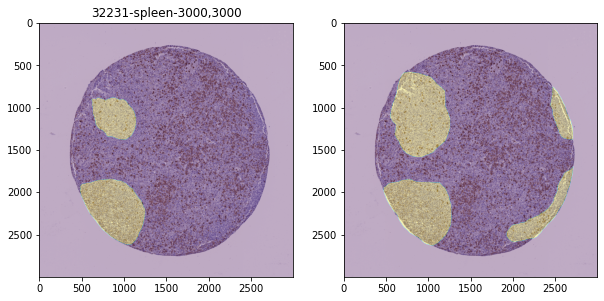

0.650083287303524 0.650083287303524


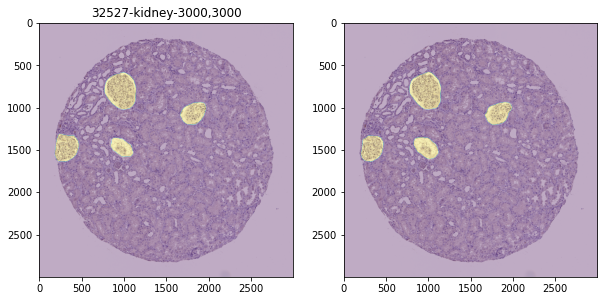

0.9526465398941384 0.8013649135988312


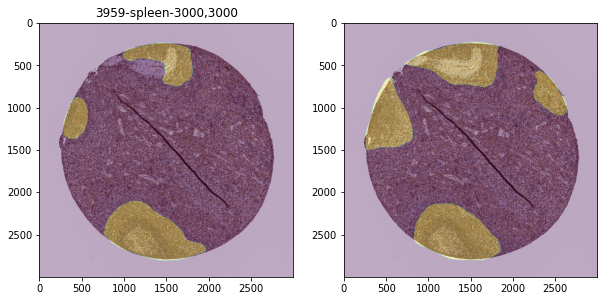

0.7364888474619713 0.779739558219878


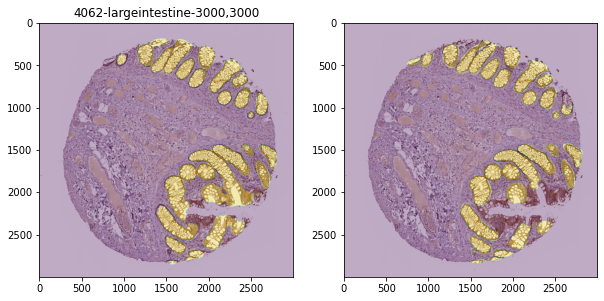

0.8602983206425368 0.7998792488255426


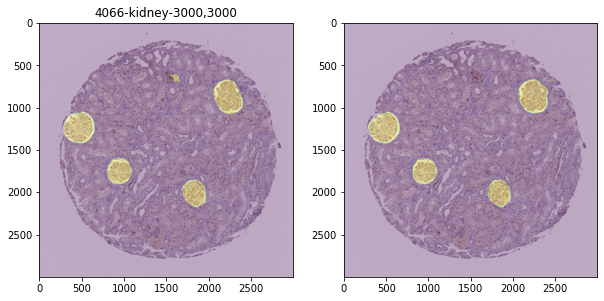

0.9603844453058038 0.831980288121595


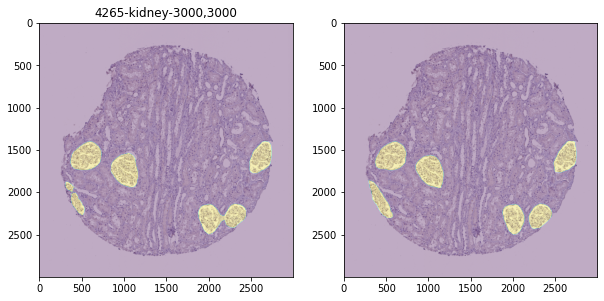

0.9383596980779992 0.8497101897809957


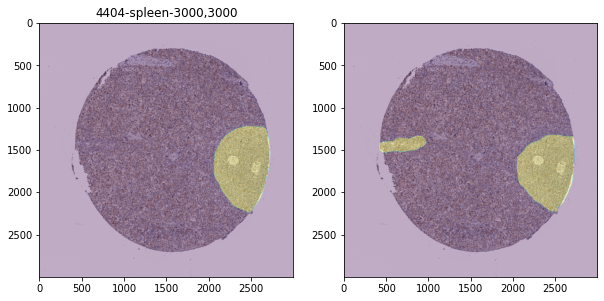

0.8499217029582973 0.8497404059491815


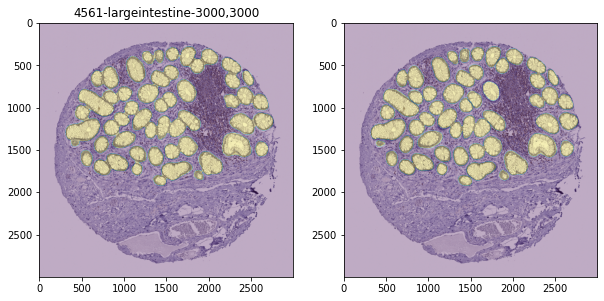

0.9534387634109058 0.862702700631897


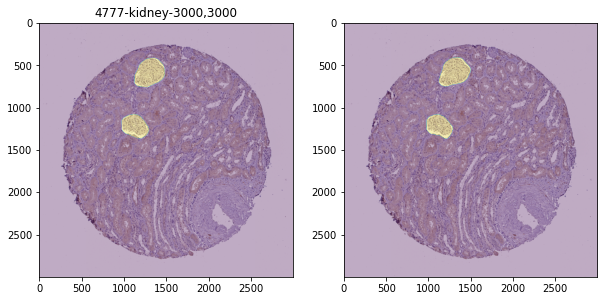

0.9549341973184751 0.8729506447081835


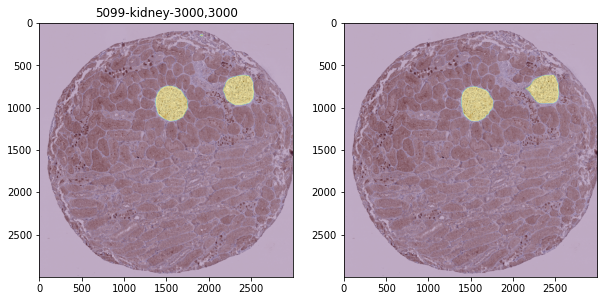

0.9550323573636843 0.8811588159737335


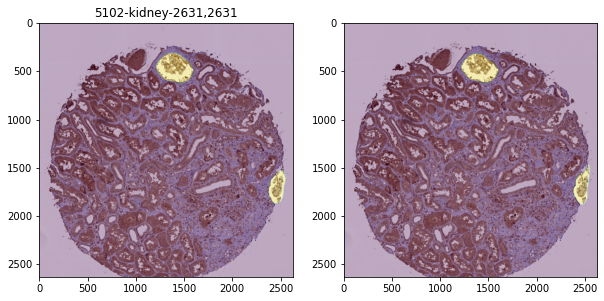

0.9451651976802607 0.8869775779470541


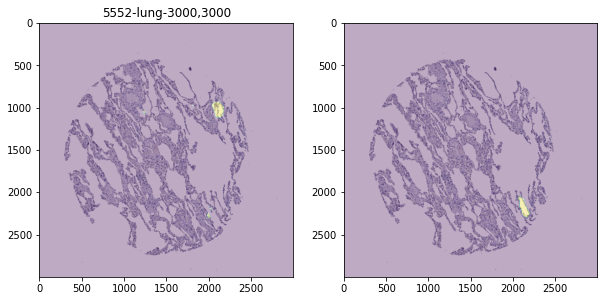

0.0 0.8130627797847997


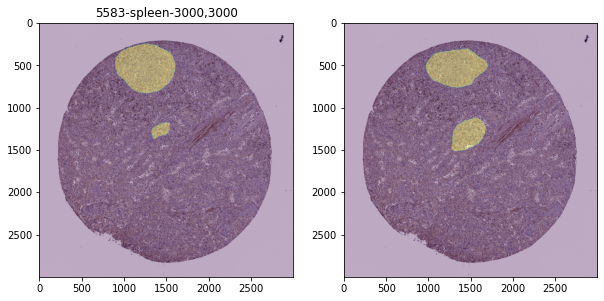

0.7356343615947336 0.807106747616333


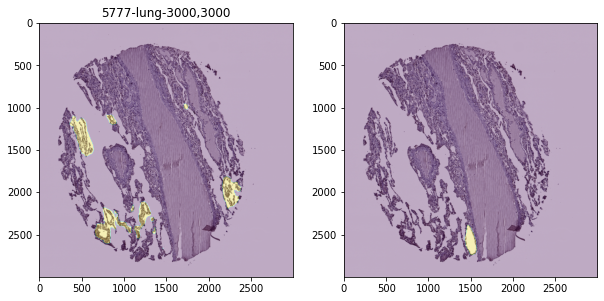

0.0009943561715230107 0.7495272910845608


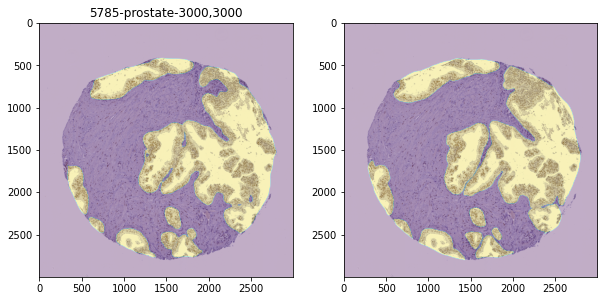

0.9368562097507357 0.7620158856623059


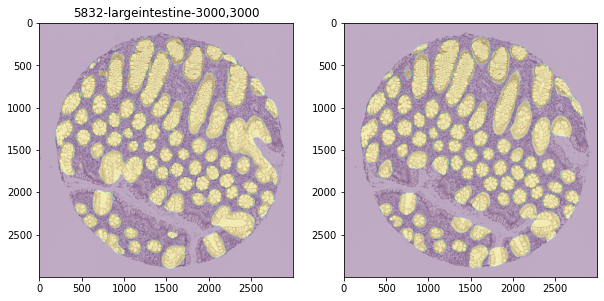

0.8845645069231145 0.7696751744911065


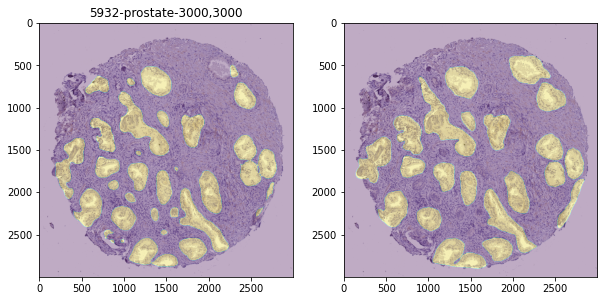

0.822630352044767 0.7727901849354394


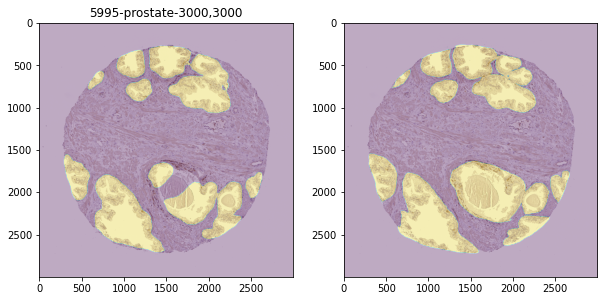

0.879963394735149 0.7787442521465344


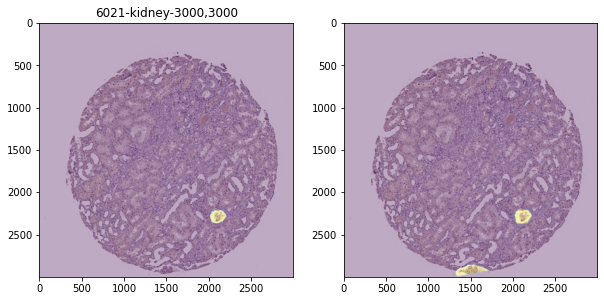

0.5481375670342707 0.7666070581932574


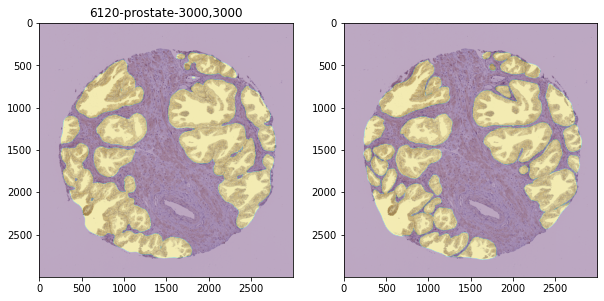

0.9306217354466936 0.7748077920559292


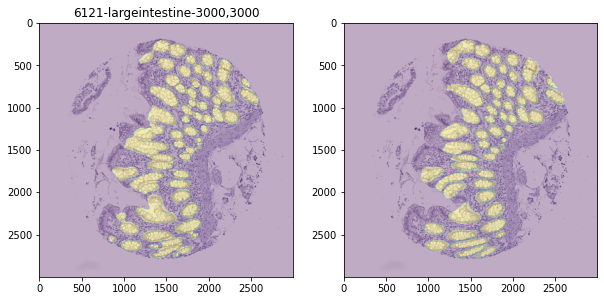

0.8773278139835963 0.7796896978620086


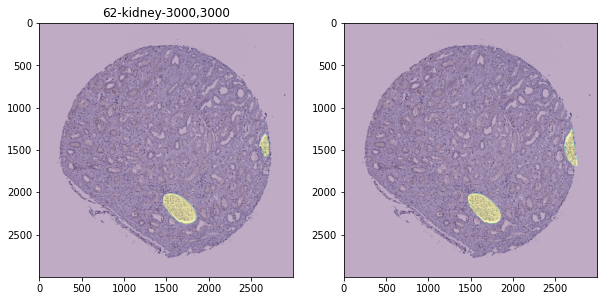

0.8950263837431234 0.7849322744929683


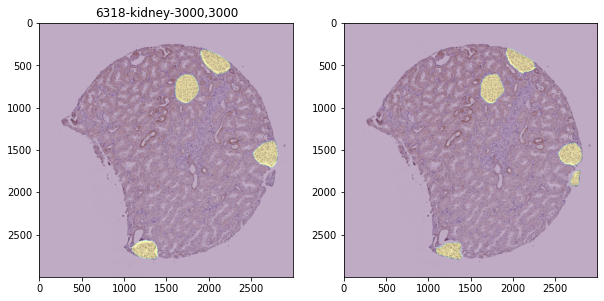

0.8975624327876688 0.7898292378970858


In [ ]:
from PIL import Image
from transformers import SegformerFeatureExtractor
feature_extractor = SegformerFeatureExtractor(reduce_labels=False, size=(WIDTH, HEIGHT))

# print(pixel_values.shape)
# image = Image.open('/content/hubmap/train_images/10651.tiff')
# plt.imshow(image)

model2.eval()
dice = 0.0

test_df = df[df['fold'] == FOLD].reset_index()
for i in range(len(test_df)) :
  id = test_df.id[i]
  fname = "/content/hubmap/train_images/{}.tiff".format(id)
  image = Image.open(fname)
  encoding = feature_extractor(image, return_tensors="pt")
  pixel_values = encoding.pixel_values.cuda()
  organ = test_df.organ[i]
  rle = test_df.rle[i]
  height, width = test_df.img_height[i], test_df.img_width[i]
  idx = class2idx[organ]
  with torch.no_grad():
    outputs = model2(pixel_values=pixel_values)
    upsampled_logits = nn.functional.interpolate(outputs['logits'],
                # size=image.size[::-1], # (height, width)
                (height, width),
                mode='bilinear',
                align_corners=False)
    mask = upsampled_logits.argmax(dim=1)[0]
    mask[mask != idx] = 0
    mask[mask == idx] = 1

  gt = rle2mask(rle, shape = (height, width))
  plt.figure(figsize=(10,10))
  plt.subplot(1, 2, 1)
  plt.imshow(image)
  plt.imshow(mask.cpu().numpy(), alpha=0.3)
  plt.title("{}-{}-{},{}".format(id, organ, width, height))
  plt.subplot(1, 2, 2)
  plt.imshow(image)
  plt.imshow(gt, alpha=0.3)
  plt.show()

  dice += dice_coef(mask.cpu().numpy(), gt)
  print(dice_coef(mask.cpu().numpy(), gt), dice/(i+1))

print("DICE = ", dice/len(test_df))

In [ ]:
len(test_df)

In [ ]:
def calc_resize(w, p) :
    a = 3000/512
    target = int((w*p/0.4)/a + 0.5)
    target = (target+31)//32 * 32
    return target

calc_resize(2023, 0.4945), calc_resize(3000, 0.4), calc_resize(160, 6.263), calc_resize(4500, 0.2290)

In [ ]:
!pip install staintools
!pip install spams

In [ ]:
# 多くのカグラーは染色ツールを使用して、増強のために組織画像の色を着色しています。
# 彼らは他のより重要な側面を見逃しています：テクスチャ（すなわち形態）
import staintools

# Read data
to_augment = staintools.read_image("/content/hubmap/train_images/10044.tiff")

# Standardize brightness (optional, can improve the tissue mask calculation)
# to_augment = staintools.LuminosityStandardizer.standardize(to_augment)

# Stain augment
augmentor = staintools.StainAugmentor(method='vahadane', sigma1=0.2, sigma2=0.2)

augmentor.fit(to_augment)
augmented_images = []
for _ in range(2):
    augmented_image = augmentor.pop()
    augmented_images.append(augmented_image)

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(to_augment)
plt.show()
for e in augmented_images:
  plt.imshow(e/255)
  plt.show()